In [1]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from nltk.corpus import stopwords
from nltk import sent_tokenize
from nltk.tokenize import word_tokenize
import re
from mpl_toolkits.axes_grid1 import ImageGrid

from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv1D, MaxPool1D, BatchNormalization, Dropout, LSTM, Embedding, GlobalMaxPool1D, Reshape
from keras.utils.vis_utils import plot_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from tabulate import tabulate

import plotly.graph_objects as go
from ipywidgets import widgets
import plotly.io as pio

# from matplotlib.cm import ScalarMappable
# from matplotlib.lines import Line2D
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes


In [2]:
# Set style
sns.set_theme()
pio.templates.default = "seaborn"

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [4]:
df = pd.read_csv('tcc_ceds_music.csv')

In [5]:
# NOT USED - will be discarded later
def generate_unique_lyrics_words():
    """
    Must be run only once in order to generate the '.txt' file with unique words.
    Parameters:
        None
    Return: 
        None
    """
    words_lyrics = []
    words_lyrics_unique = []

    for i in df['lyrics']:
        words_in_song = i.split(' ')
        for word in words_in_song:
            words_lyrics.append(word)

    for word in words_lyrics:
        if word not in words_lyrics_unique:
            words_lyrics_unique.append(word)

    with open('unqiue_word.txt', 'w') as f:
        for word in words_lyrics_unique:
            try:
                f.write(word + ' ')
            except UnicodeEncodeError:
                pass
            
def get_unique_lyrics_words() -> list:
    """
    Retrieves the list of unique lyrics words from the "unique_word.txt" file.
    Params:
        None
    Return:
        words: list - list of unqiue lyrics words
    """
    unique_words = []
    with open('unqiue_word.txt','r') as f:
        lines = f.readlines()
        words = lines[0].split('')
    return words
        


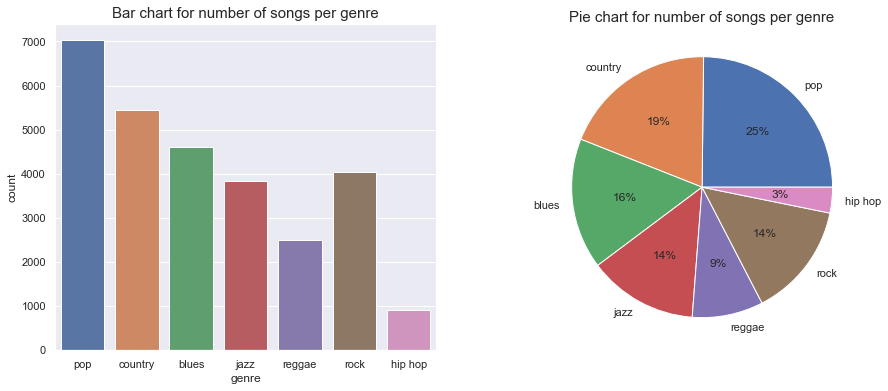

In [6]:
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.title("Bar chart for number of songs per genre", size = 15)
sns.countplot(x='genre',data=df)

list_genres = ['pop', 'country', 'blues', 'jazz', 'reggae', 'rock', 'hip hop']

count_genres = { 'name': [],
                 'count': [] }
for genre in list_genres:
    count_genres['name'].append(genre)
    count_genres['count'].append(df['genre'].value_counts()[genre])

plt.subplot(1, 2, 2)
plt.title("Pie chart for number of songs per genre", size = 15, pad=2.0)
plt.pie(count_genres['count'], labels= count_genres['name'], autopct='%.0f%%')
print()

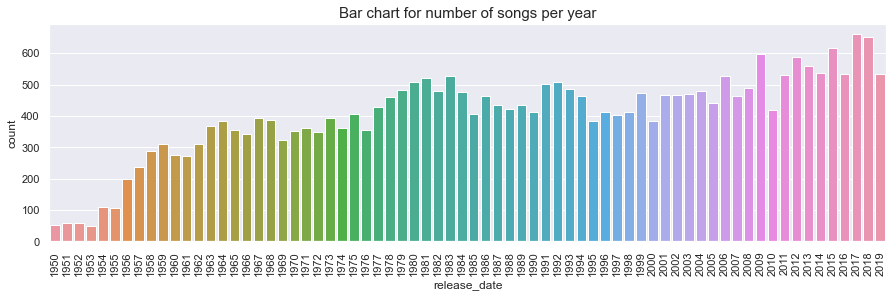

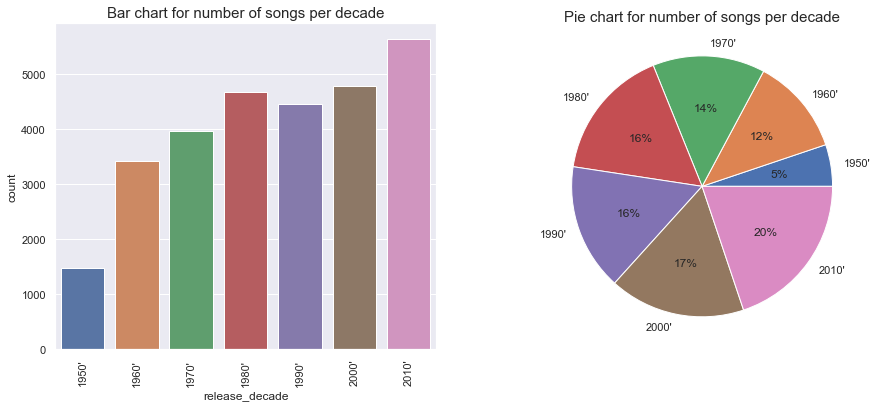

In [7]:
plt.figure(figsize=(15,4))
plt.title("Bar chart for number of songs per year", size = 15)
sns.countplot(x='release_date',data=df)
plt.xticks(rotation=90)
plt.show()


df['release_decade'] = df.apply(lambda row: str(int(row.release_date / 10) * 10) + "'", axis = 1)

    
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.title("Bar chart for number of songs per decade", size = 15)
sns.countplot(x='release_decade',data=df)
plt.xticks(rotation=90)

count_release_decade = { 'name': [],
                         'count': [] }
list_release_decades = ["1950'", "1960'", "1970'", "1980'", "1990'", "2000'", "2010'"]

for release_decade in list_release_decades:
    count_release_decade['name'].append(release_decade)
    count_release_decade['count'].append(df['release_decade'].value_counts()[release_decade])
    
plt.subplot(1, 2, 2)
plt.title("Pie chart for number of songs per decade", size = 15, pad=2.0)
plt.pie(count_release_decade['count'], labels= count_release_decade['name'], autopct='%.0f%%')

print()

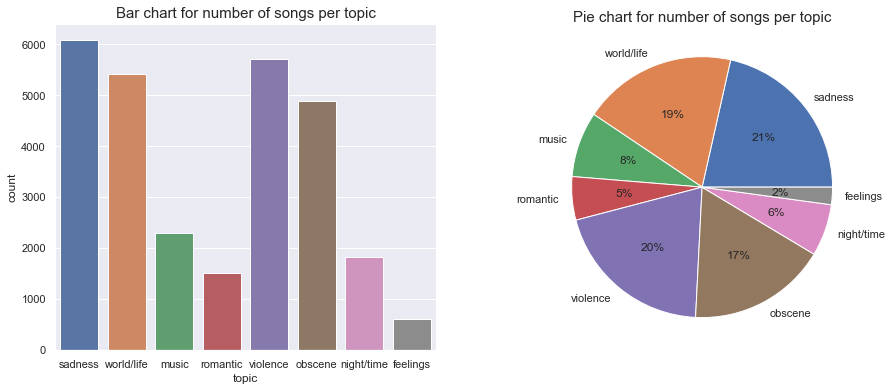

In [8]:
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.title("Bar chart for number of songs per topic", size = 15)
sns.countplot(x='topic',data=df)

list_topics = ['sadness', 'world/life', 'music', 'romantic', 'violence', 'obscene', 'night/time', 'feelings']

count_topics = { 'name': [],
                 'count': [] }

for topic in list_topics:
    count_topics['name'].append(topic)
    count_topics['count'].append(df['topic'].value_counts()[topic])

plt.subplot(1, 2, 2)
plt.title("Pie chart for number of songs per topic", size = 15, pad=2.0)
plt.pie(count_topics['count'], labels= count_topics['name'], autopct='%.0f%%')
print()


In [9]:
# clean = []
# stop_words = stopwords.words('english')
# stop_words.append('chorus')
# stop_words.append('verse')
# lemmatizer = WordNetLemmatizer()

In [10]:
# for index, row in df.iterrows():
#     lyrics = row['lyrics']
#     lyrics = re.sub('\n', "", lyrics)
#     lyrics = re.sub('x1', "", lyrics)
#     lyrics = re.sub('x2', "", lyrics)
#     lyrics = re.sub('x3', "", lyrics)
#     lyrics = re.sub('x4', "", lyrics)
#     lyrics = re.sub('x5', "", lyrics)
#     lyrics = re.sub('x6', "", lyrics)
#     lyrics = re.sub('x7', "", lyrics)
#     lyrics = re.sub('x8', "", lyrics)
#     lyrics = re.sub('x9', "", lyrics)
#     lyrics = lyrics.lower() #lowercasing
#     lyrics = re.sub("[^a-z]+", " ", lyrics) #remove all numbers and special chars
#     lyrics = lyrics.split()
#     lyrics = [word for word in lyrics if not word in stop_words] #remove stopwords
#     lyrics = [lemmatizer.lemmatize(token) for token in lyrics] #lemmatize
#     lyrics = [lemmatizer.lemmatize(token, "v") for token in lyrics]
#     lyrics = " ".join(lyrics)
#     clean.append(lyrics)
# df['clean_lyrics'] = clean #add clean lyrics to a new column in the dataframe

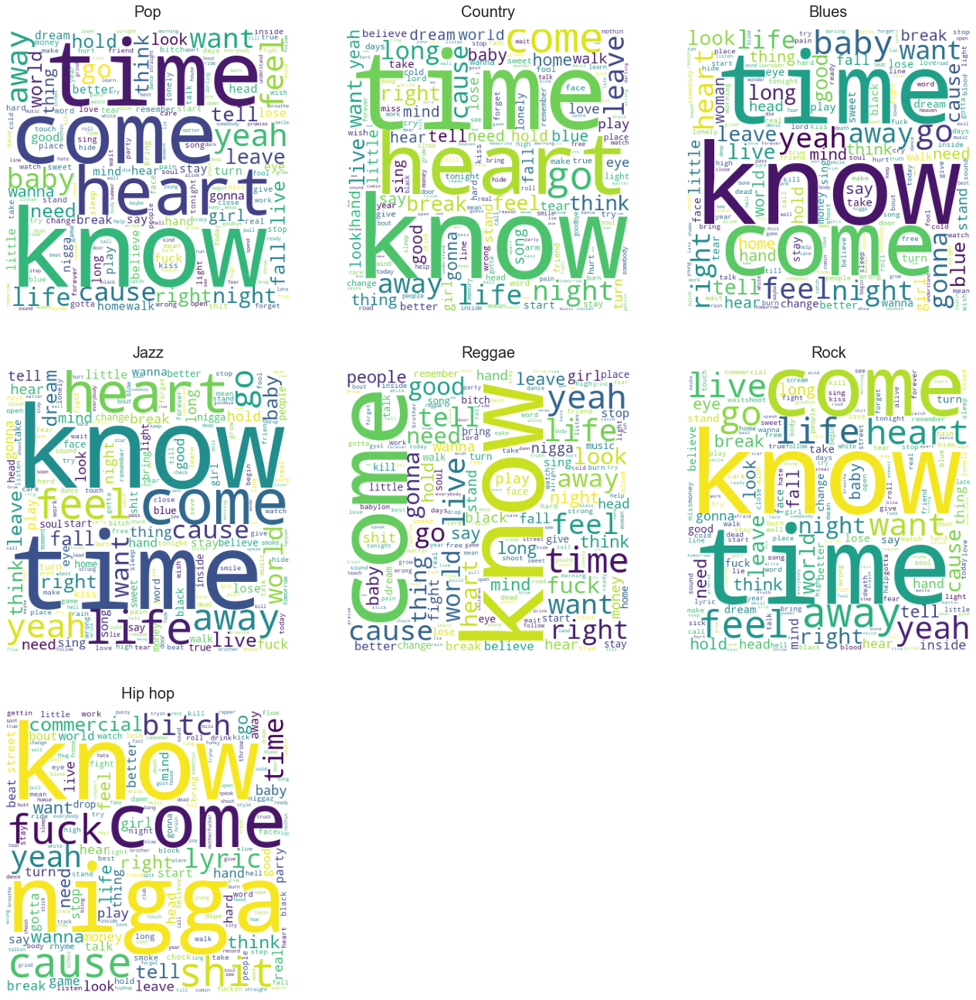

In [11]:
def empty_image(height=400, width=400):
    empty_img = np.zeros([height,width,3],dtype=np.uint8)
    empty_img.fill(255)
    return(empty_img)

dict_genres_words = {}
for genre in list_genres:
    dict_genres_words[genre] = ' '.join(df[df.genre == genre].lyrics.values)
    
wordcloud_figures = []
figure_titles = []
for genre in dict_genres_words:
    figure_titles.append(genre.capitalize())
    wordcloud_figures.append(WordCloud(width=400, height=400, background_color='white', repeat=False, collocations=False).generate(dict_genres_words[genre]))

fig = plt.figure(1,(23, 23))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=1, share_all=True)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])

# grid.set_title("Word clouds for genres")
for i in range(len(list_genres)):
    grid[i].imshow(wordcloud_figures[i])
    grid[i].set_title(figure_titles[i], size=20, pad=15.0)

grid[7].imshow(empty_image())
grid[8].imshow(empty_image())
print()

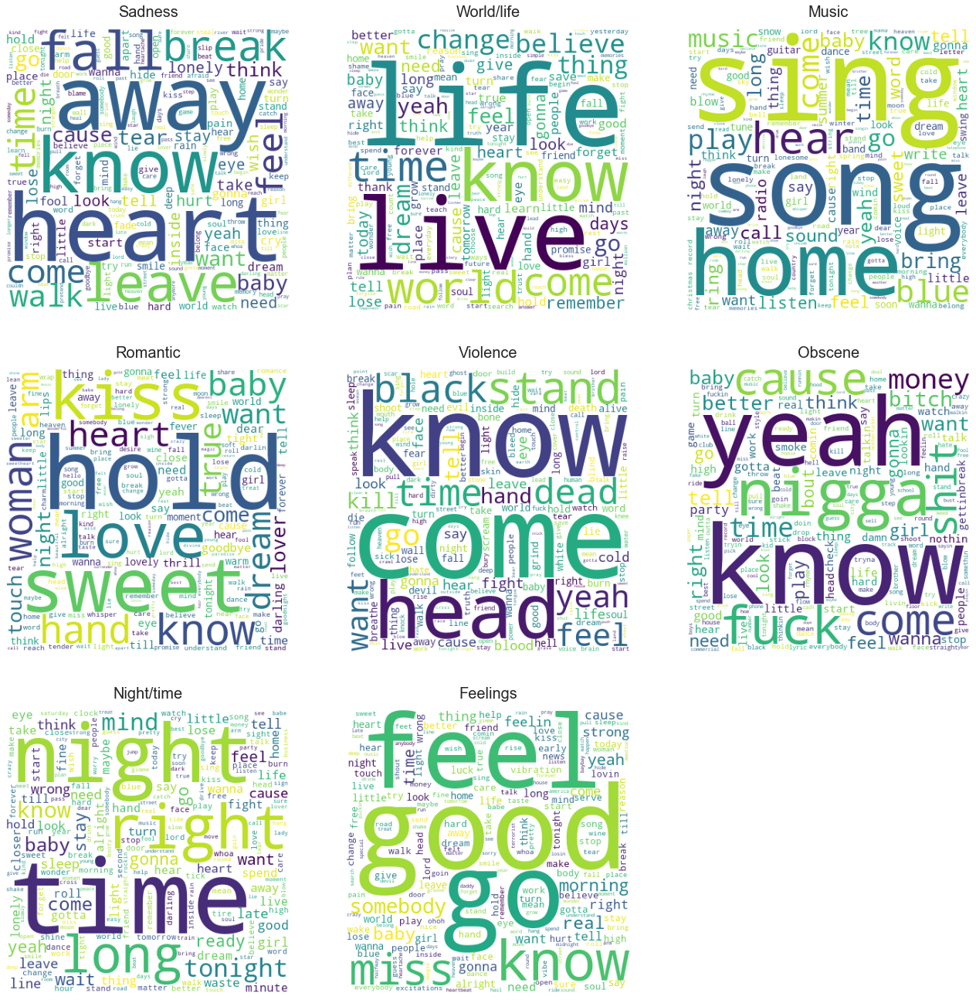

In [12]:
dict_topics_words = {}
for topic in list_topics:
    dict_topics_words[topic] = ' '.join(df[df.topic == topic].lyrics.values)
    
wordcloud_figures = []
figure_titles = []
for topic in dict_topics_words:
    figure_titles.append(topic.capitalize())
    wordcloud_figures.append(WordCloud(width=400, height=400, background_color='white', repeat=False, collocations=False).generate(dict_topics_words[topic]))

fig = plt.figure(1,(23, 23))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=1, share_all=True)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
for i in range(len(list_topics)):
    grid[i].imshow(wordcloud_figures[i])
    grid[i].set_title(figure_titles[i], size = 20, pad=15.0)
    
grid[8].imshow(empty_image())
print()

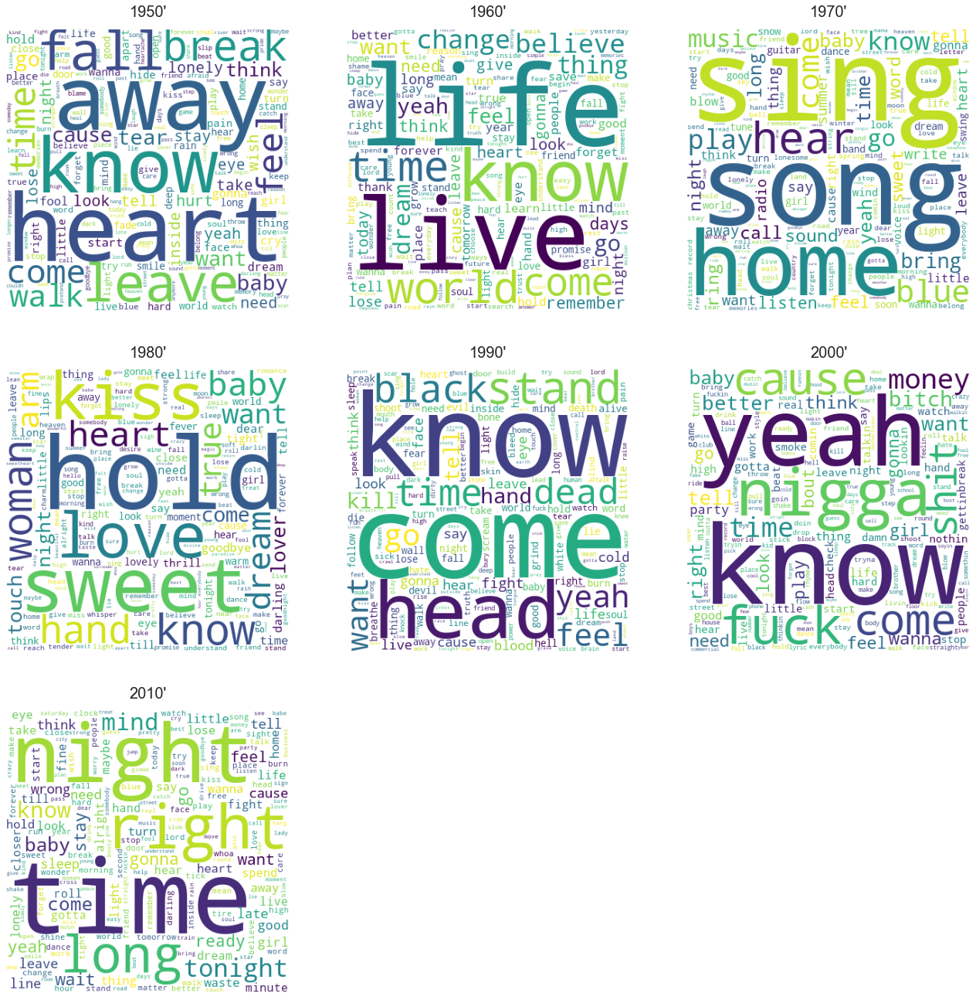

In [13]:
dict_release_decades_words = {}
for release_decade in list_release_decades:
    dict_release_decades_words[release_decade] = ' '.join(df[df.release_decade == release_decade].lyrics.values)
    
for release_decade in list_release_decades:
    wordcloud_figures.append(WordCloud(width=400, height=400, background_color='white', repeat=False, collocations = False).generate(dict_release_decades_words[release_decade]))

fig = plt.figure(1,(23, 23))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=1, share_all=True)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
for i in range(len(list_release_decades)):
    grid[i].imshow(wordcloud_figures[i])
    grid[i].set_title(list_release_decades[i], size = 20, pad=15.0)
    
grid[7].imshow(empty_image())
grid[8].imshow(empty_image())
print()

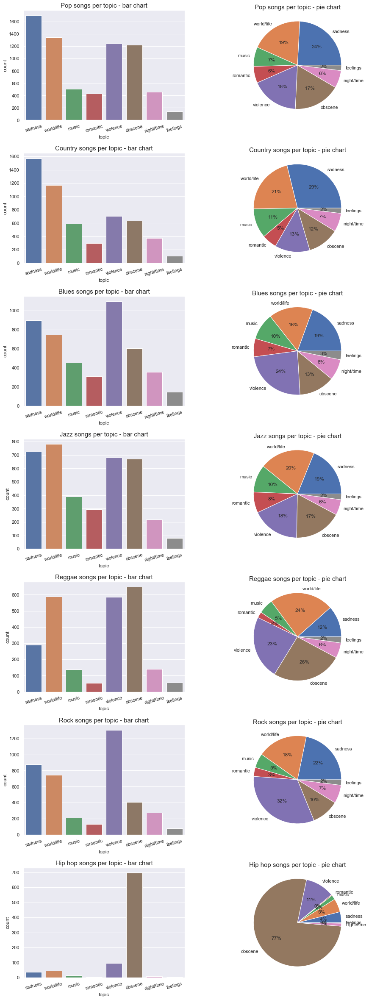

In [14]:
plt.figure(figsize=(15, 42))
plt.subplots_adjust(hspace=0.3)

for i in range(len(list_genres)):
    plt.subplot(len(list_genres),2,i*2+1)
    sns.countplot(x='topic',data=df[df.genre == list_genres[i]], order = list_topics)
    plt.xticks(rotation=15)
    plt.title(list_genres[i].capitalize() + " songs per topic - bar chart", size = 15)
    
    plt.subplot(len(list_genres),2,i*2+2)
    count_topics = { 'name': [],
                     'count': [] }

    for topic in list_topics:
        count_topics['name'].append(topic)
        count_topics['count'].append(df['topic'].loc[df['genre'] == list_genres[i]].value_counts()[topic])

    plt.title(list_genres[i].capitalize() + " songs per topic - pie chart", size = 15, pad=2.0)
    plt.pie(count_topics['count'], labels= count_topics['name'], autopct='%.0f%%')
print()

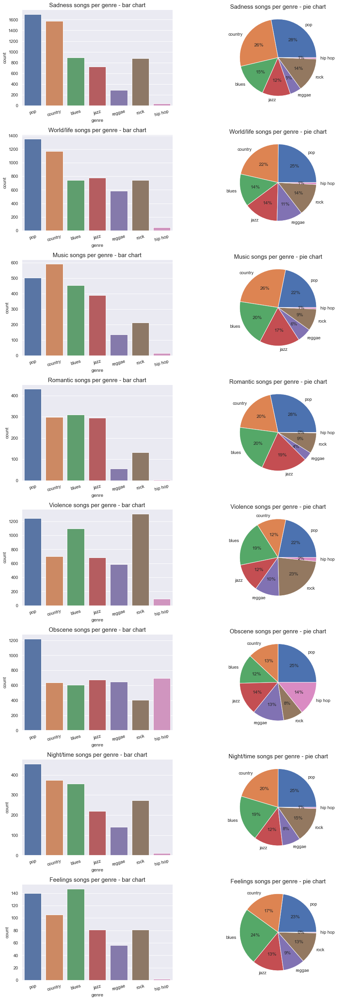

In [15]:
plt.figure(figsize=(15, (len(list_topics) +1) * 5))
plt.subplots_adjust(hspace=0.3)

for i in range(len(list_topics)):
    plt.subplot(len(list_topics),2,i*2+1)
    sns.countplot(x='genre',data=df[df.topic == list_topics[i]], order = list_genres)
    plt.xticks(rotation=15)
    plt.title(list_topics[i].capitalize() + " songs per genre - bar chart", size = 15)
    
    plt.subplot(len(list_topics),2,i*2+2)
    count_genres = { 'name': [],
                     'count': [] }

    for genre in list_genres:
        count_genres['name'].append(genre)
        count_genres['count'].append(df['genre'].loc[df['topic'] == list_topics[i]].value_counts()[genre])

    plt.title(list_topics[i].capitalize() + " songs per genre - pie chart", size = 15, pad=2.0)
    plt.pie(count_genres['count'], labels= count_genres['name'], autopct='%.0f%%')
print()

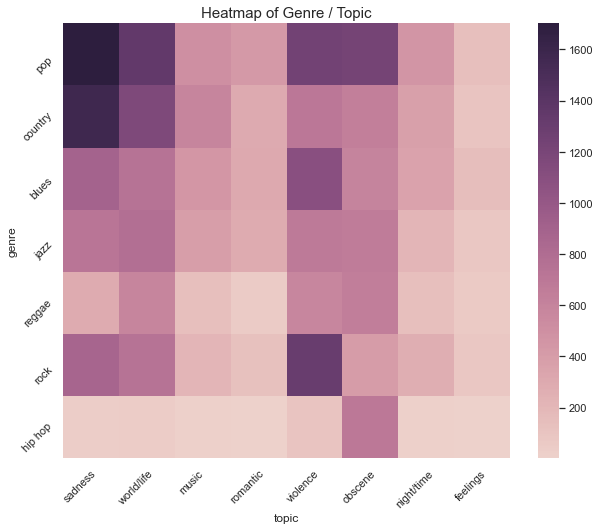

In [16]:
heatmap_genre_emotion = np.zeros((len(df['genre'].unique()), len(df['topic'].unique())))

unique_genre = list(df['genre'].unique())
unique_topic = list(df['topic'].unique())

for genre, topic in zip(df['genre'], df['topic']):
    heatmap_genre_emotion[unique_genre.index(genre), unique_topic.index(topic)] += 1

plt.figure(figsize = (10,8))
plt.title("Heatmap of Genre / Topic", size=15)
ax = sns.heatmap(heatmap_genre_emotion, cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_xlabel("topic")
ax.set_ylabel("genre")
c = ax.set_yticks(np.arange(len(unique_genre))+0.65, unique_genre, rotation=45)
c = ax.set_xticks(np.arange(len(unique_topic))+0.3, unique_topic, rotation=45)

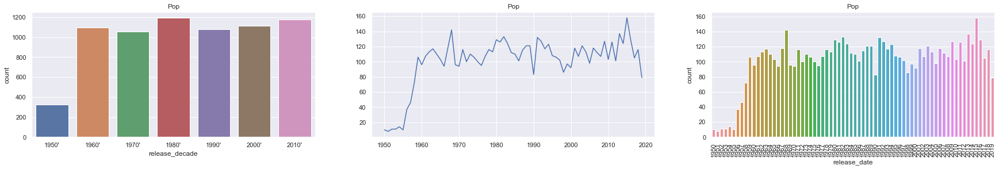

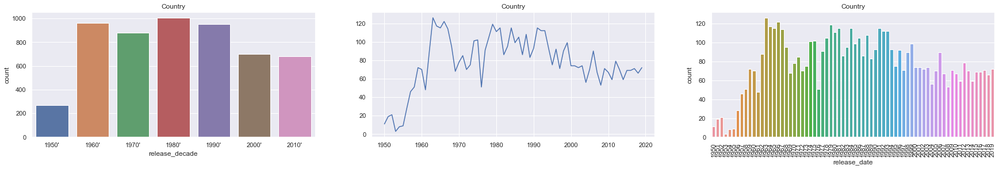

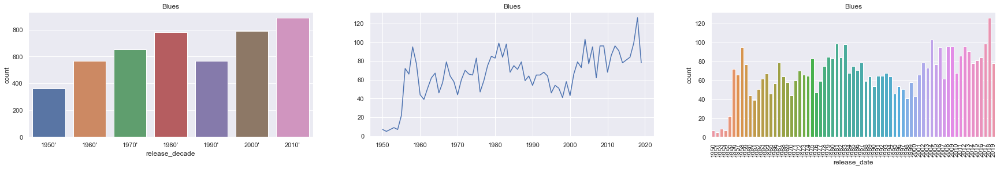

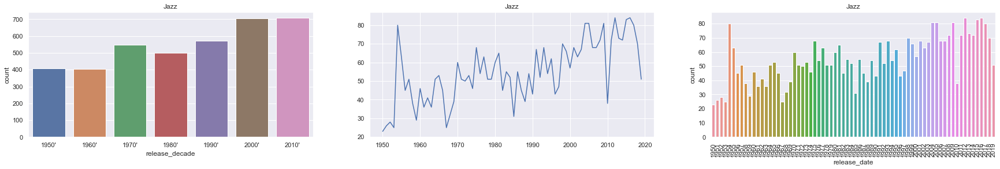

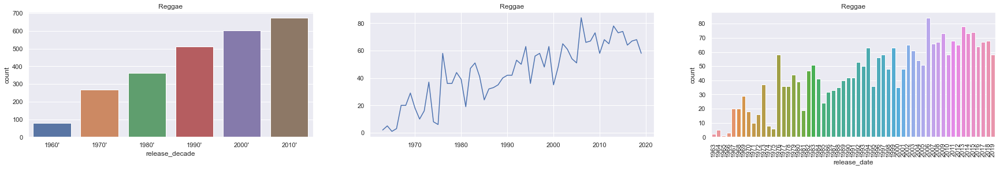

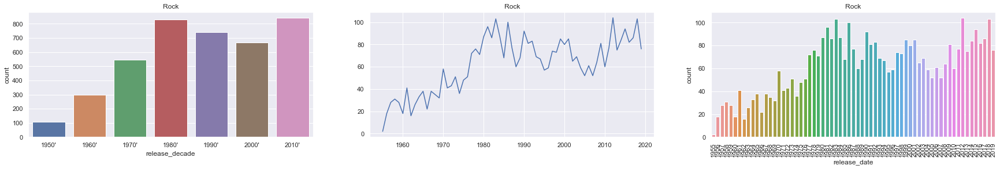

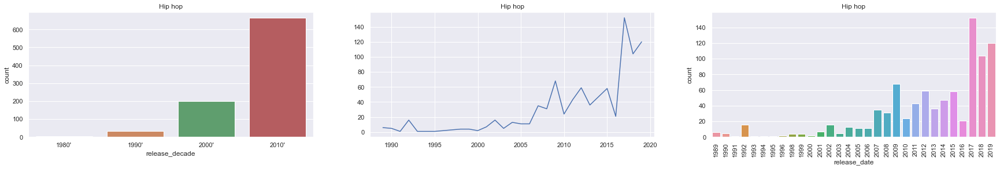

In [17]:
for i in range(len(list_genres)):
    fig, ax =plt.subplots(1,3, figsize=(30,4))
    df_genre = df[df.genre == list_genres[i]]
    
    plt.title(list_genres[i].capitalize())
    sns.countplot(x='release_decade',data=df_genre, ax=ax[0])
    ax[0].title.set_text(list_genres[i].capitalize())
    
    counts = df_genre['release_date'].value_counts(sort=False)
    sns.lineplot(x=counts.index, y=counts.values, ax=ax[1])
    ax[1].title.set_text(list_genres[i].capitalize())
    plt.xticks(rotation=90)
    sns.countplot(x='release_date',data=df_genre, ax=ax[2])
    plt.show()

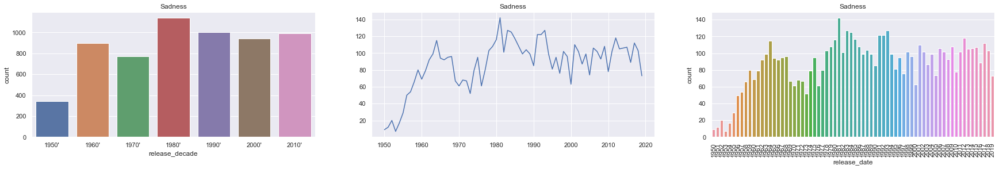

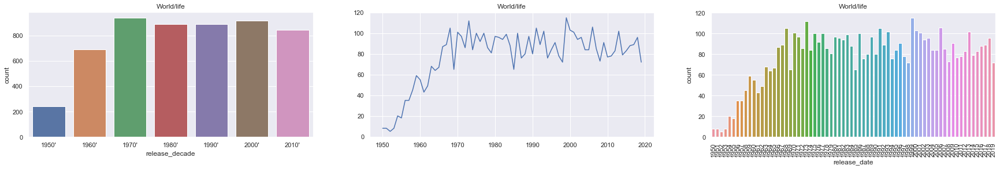

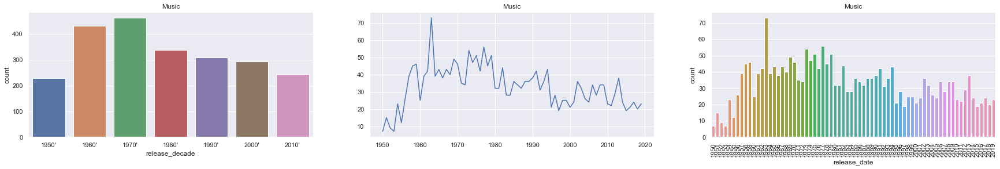

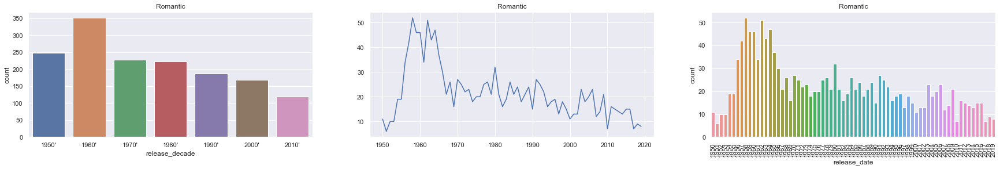

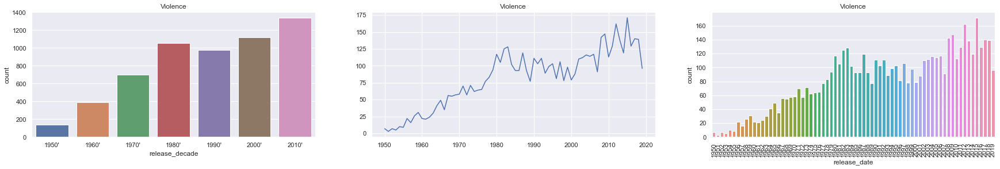

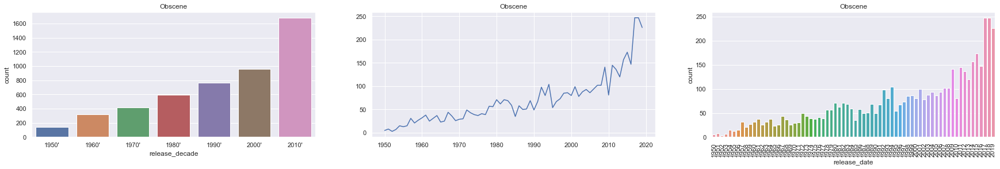

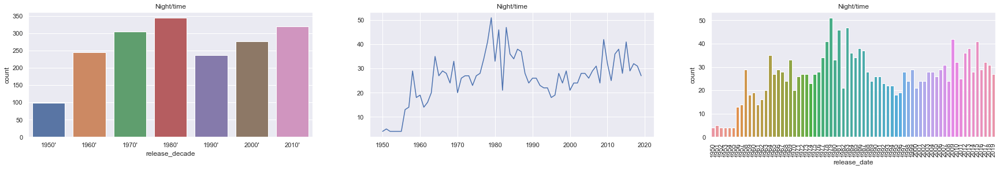

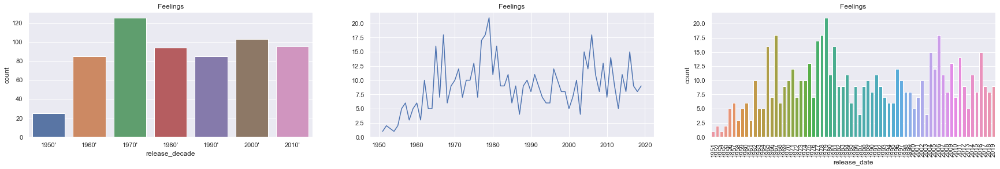

In [18]:
for i in range(len(list_topics)):
    fig, ax =plt.subplots(1,3, figsize=(30,4))
    df_topic = df[df.topic == list_topics[i]]
    
    plt.title(list_topics[i].capitalize())
    sns.countplot(x='release_decade',data=df_topic, ax=ax[0])
    ax[0].title.set_text(list_topics[i].capitalize())
    
    counts = df_topic['release_date'].value_counts(sort=False)
    sns.lineplot(x=counts.index, y=counts.values, ax=ax[1])
    ax[1].title.set_text(list_topics[i].capitalize())
    plt.xticks(rotation=90)
    sns.countplot(x='release_date',data=df_topic, ax=ax[2])
    plt.show()

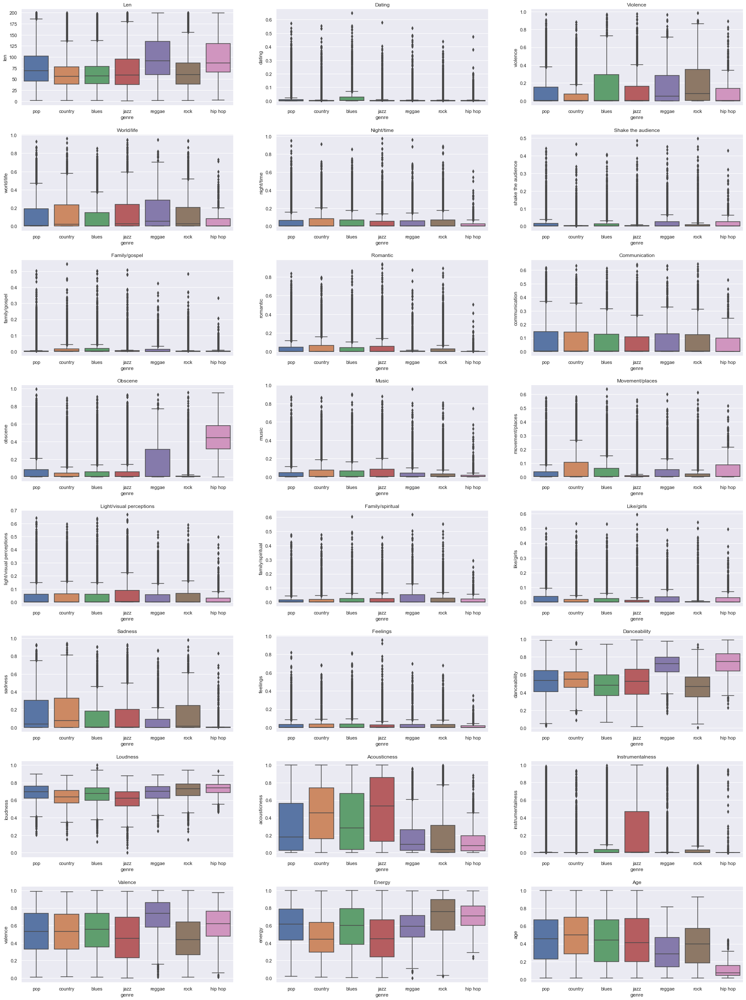

In [19]:
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.boxplot(x="genre", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

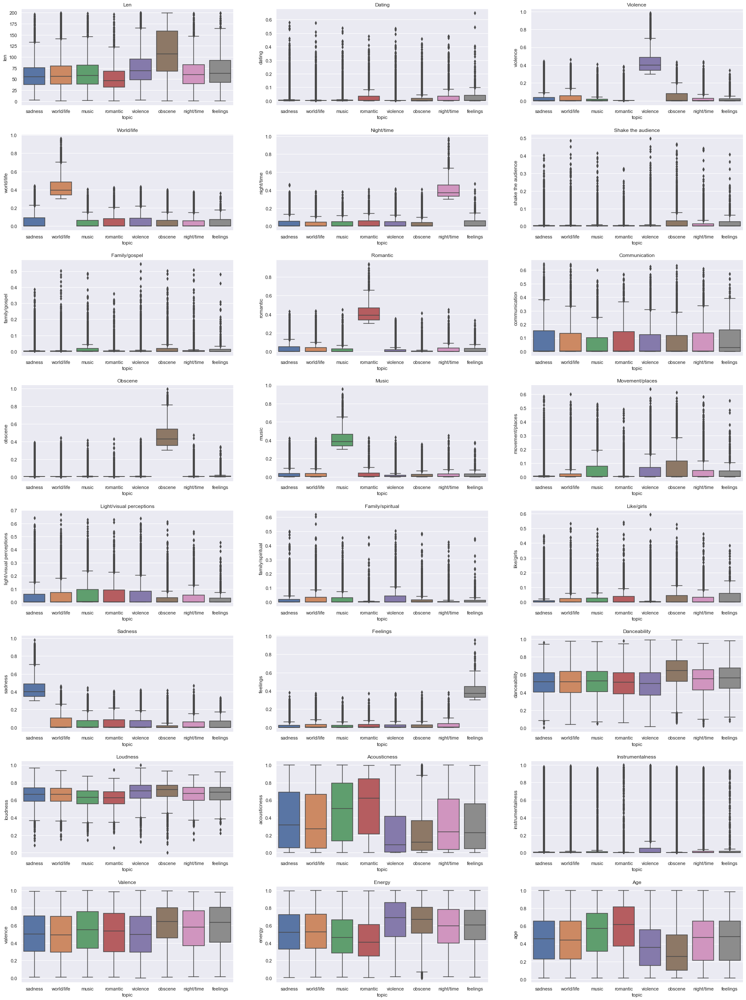

In [20]:
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.boxplot(x="topic", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

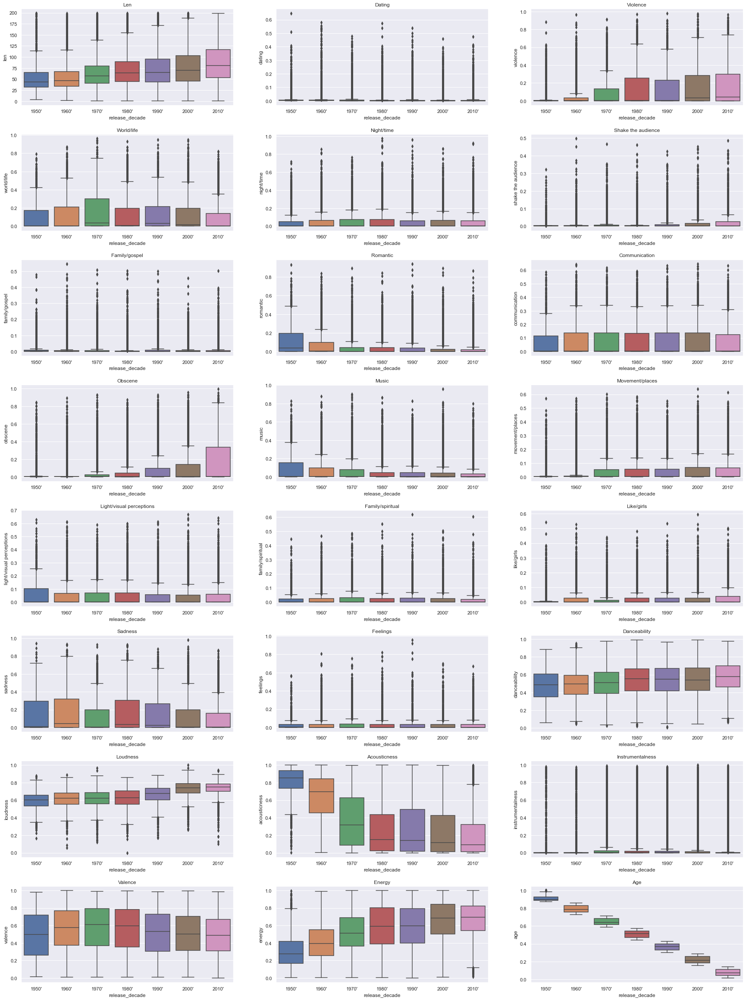

In [21]:
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.boxplot(x="release_decade", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

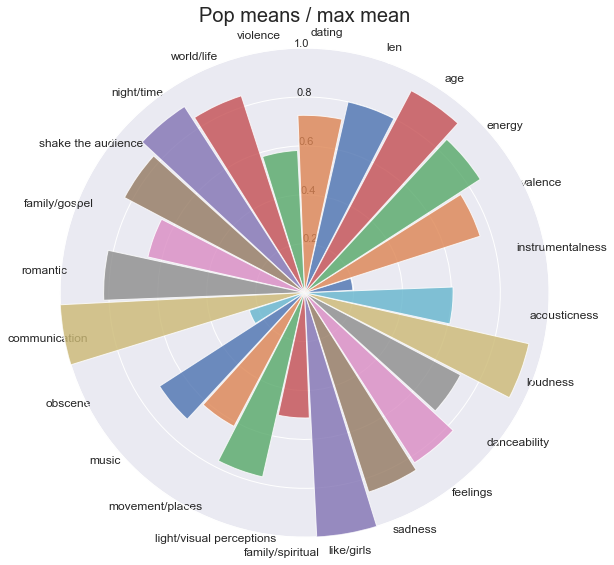

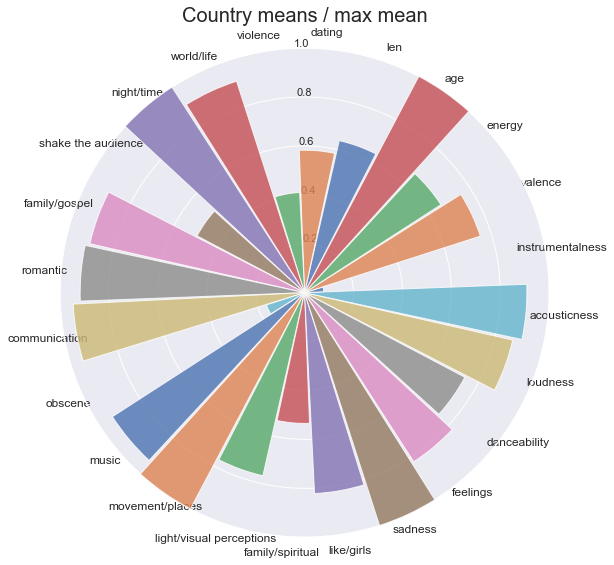

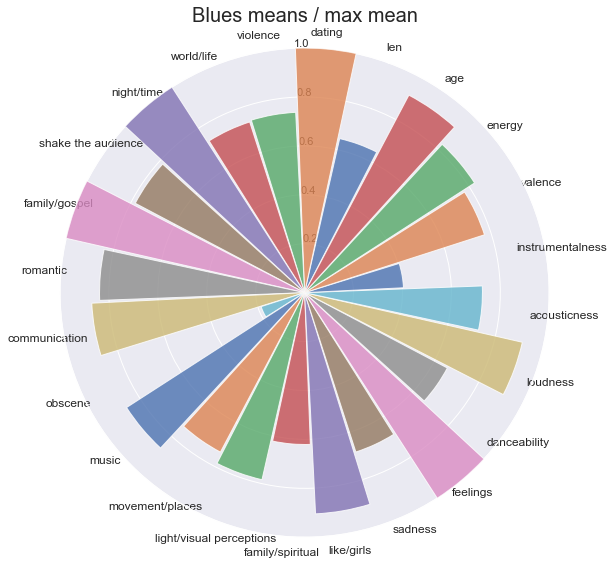

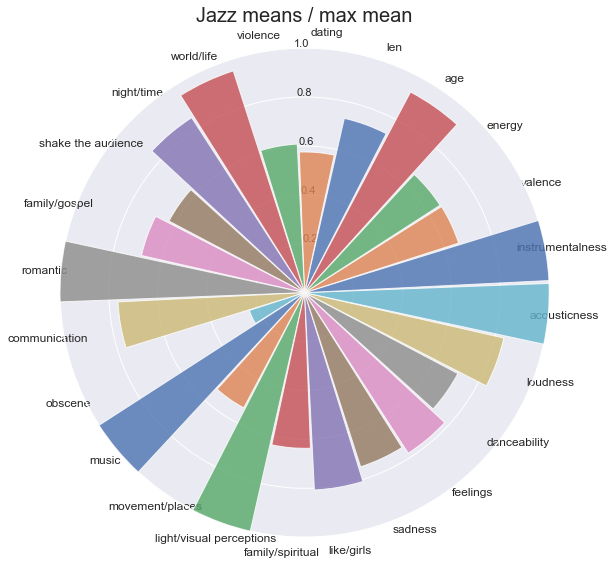

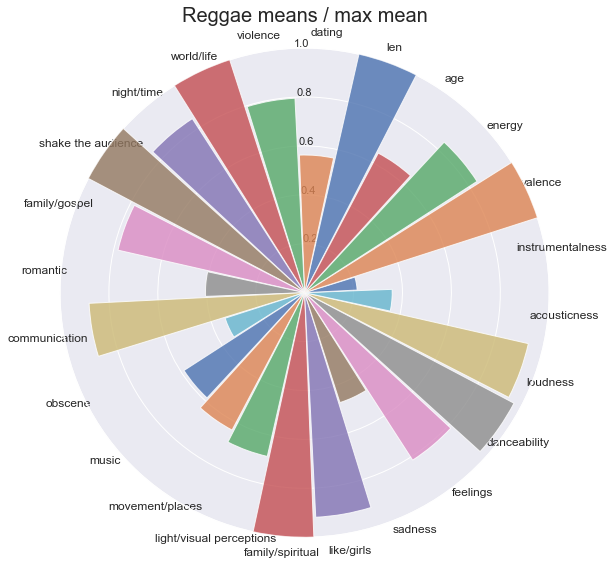

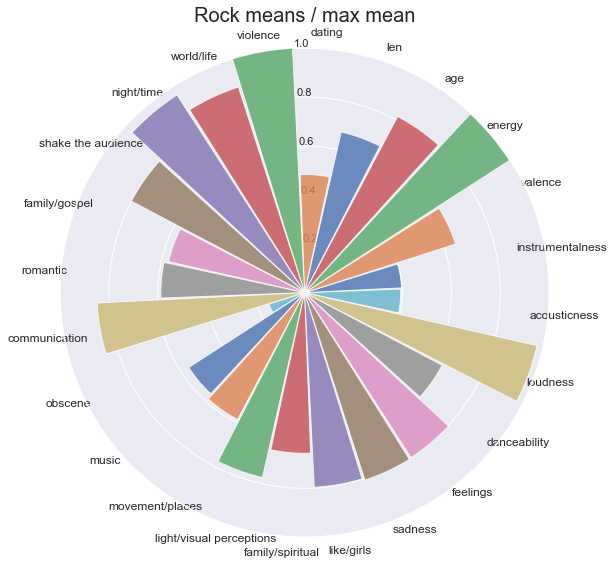

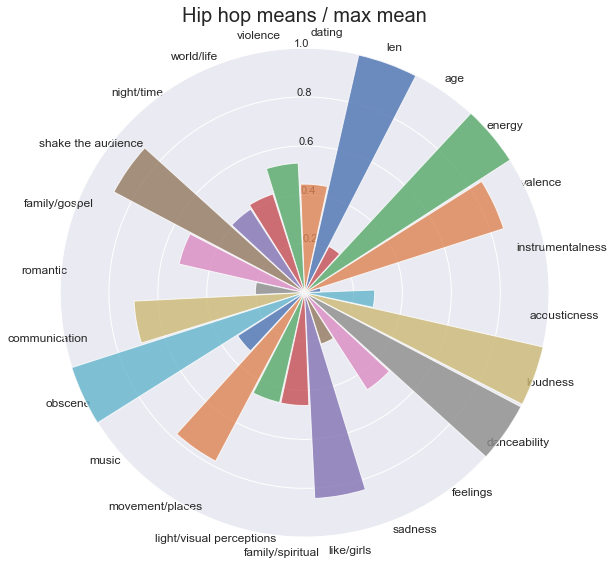

In [22]:
# Create the data
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']

max_mean = {}
for feature in features:
    max_mean[feature] = 0

mean_features = {}
for i in range(len(list_genres)):
    genre = list_genres[i]
    mean_features[genre] = { 'name': [],
                             'mean': [] }
    for feature in features:
        mean_features[genre]['name'].append(feature)
        mean = df[feature].loc[df['genre'] == list_genres[i]].mean()
        mean_features[genre]['mean'].append(mean)
        if max_mean[feature] < mean:
            max_mean[feature] = mean

for i in range(len(list_genres)): 
    genre = list_genres[i]
    for i in range(len(features)):
        mean_features[genre]['mean'][i] = mean_features[genre]['mean'][i] / max_mean[features[i]]


# Create the plots

# colors = ['#6c5b7b', '#88617e', '#a36681', '#bd6b84', '#da6f82', '#f67280', '#f78988', '#f79e8f', '#f8b195']
colors = sns.color_palette()

angles = [n / float(len(features)) * 2 * np.pi for n in range(len(features))]

for genre in list_genres:
    lenghts = mean_features[genre]['mean']

    fig, ax = plt.subplots(figsize=(9, 9), subplot_kw={"projection": "polar"})
    fig.patch.set_facecolor("white")
    ax.set_theta_offset(np.deg2rad(70))
    ax.set_ylim(0, 1)
    ax.bar(angles, lenghts, color = colors, alpha=0.8, width=0.25, zorder=10)
    # ax.vlines(angles, 0, 1, color = "#1f1f1f", ls=(0, (4, 4)), zorder=11)


    ax.set_title(genre.capitalize() + " means / max mean", size = 20)
    ax.set_xticks(angles)
    ax.set_xticklabels(features, size = 12)


    ax.xaxis.grid(False)
    print()

    plt.show()

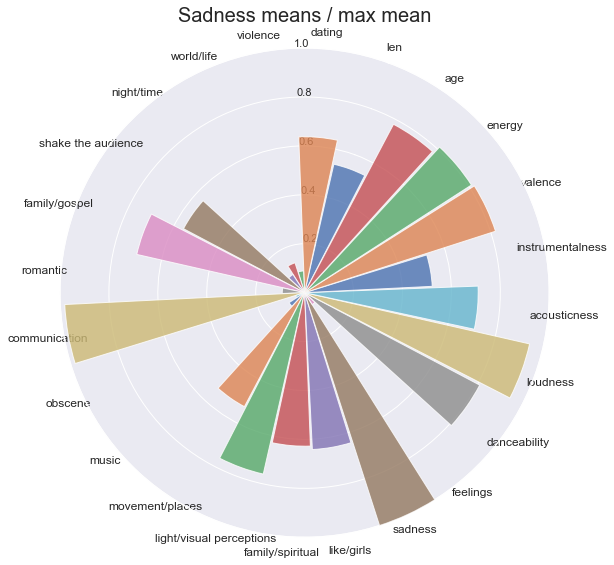

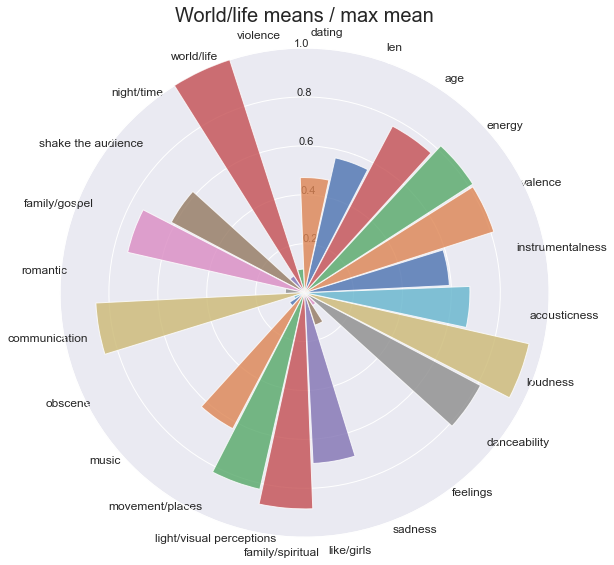

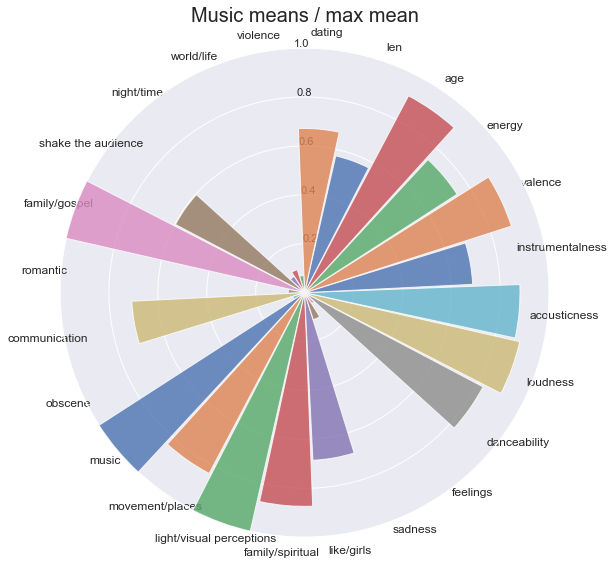

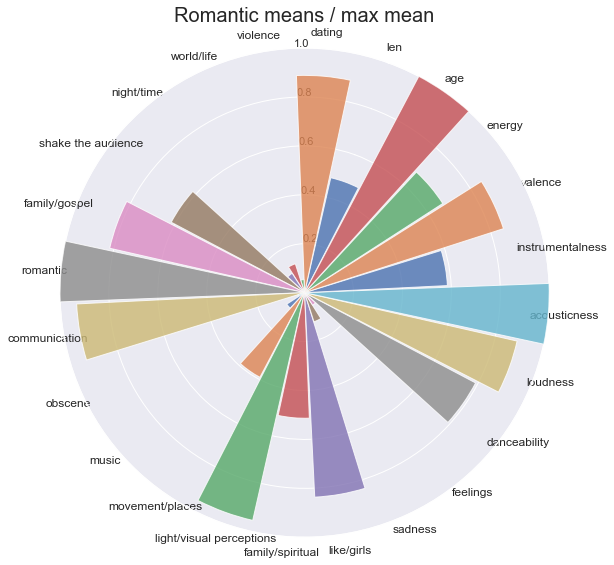

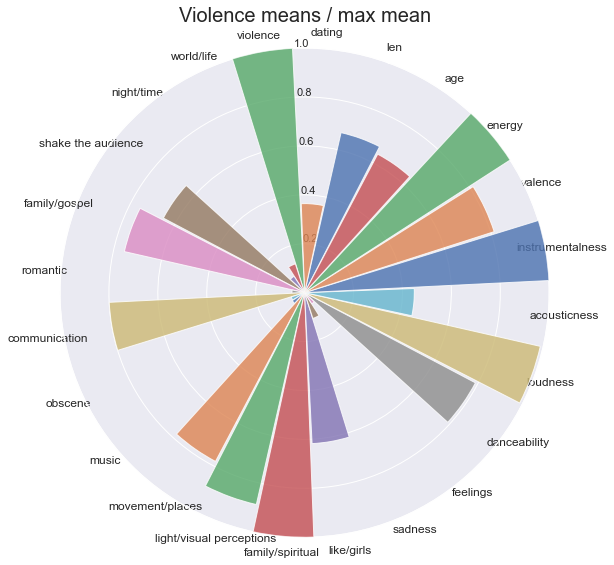

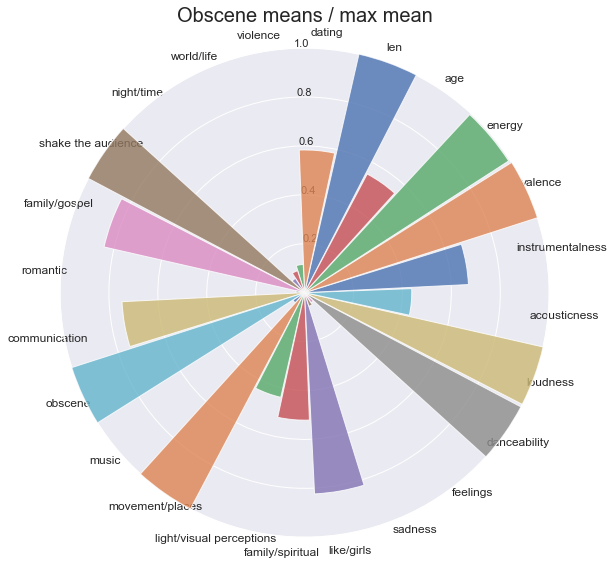

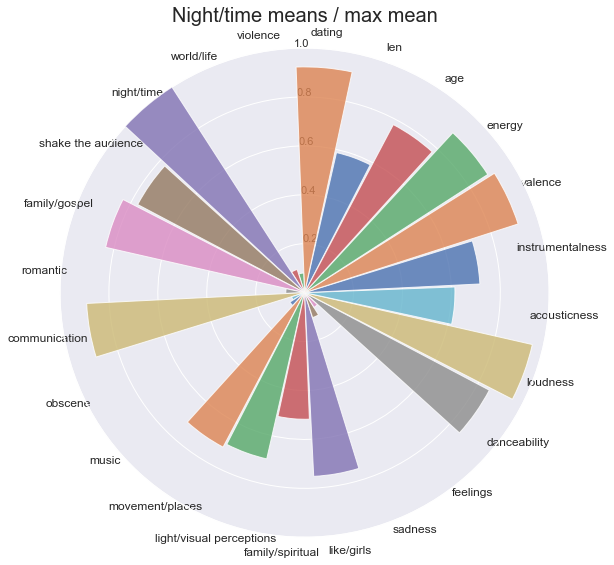

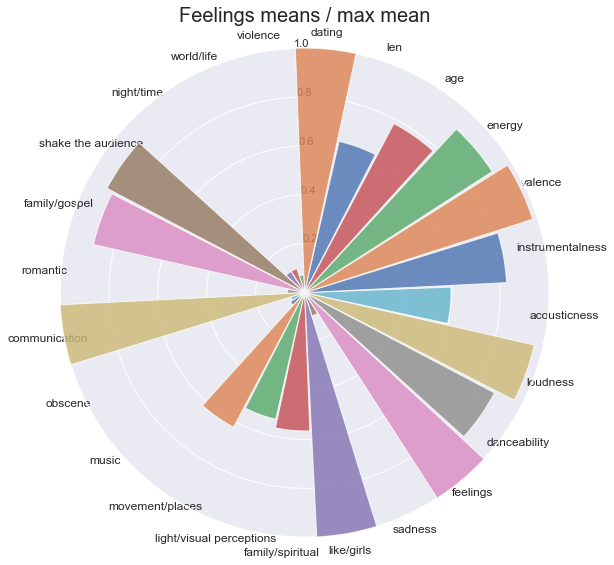

In [23]:
# Create the data
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']

max_mean = {}
for feature in features:
    max_mean[feature] = 0

mean_features = {}
for i in range(len(list_topics)):
    topic = list_topics[i]
    mean_features[topic] = { 'name': [],
                             'mean': [] }
    for feature in features:
        mean_features[topic]['name'].append(feature)
        mean = df[feature].loc[df['topic'] == list_topics[i]].mean()
        mean_features[topic]['mean'].append(mean)
        if max_mean[feature] < mean:
            max_mean[feature] = mean

for i in range(len(list_topics)): 
    topic = list_topics[i]
    for i in range(len(features)):
        mean_features[topic]['mean'][i] = mean_features[topic]['mean'][i] / max_mean[features[i]]


# Create the plots

# colors = ['#6c5b7b', '#88617e', '#a36681', '#bd6b84', '#da6f82', '#f67280', '#f78988', '#f79e8f', '#f8b195']
colors = sns.color_palette()

angles = [n / float(len(features)) * 2 * np.pi for n in range(len(features))]

for topic in list_topics:
    lenghts = mean_features[topic]['mean']

    fig, ax = plt.subplots(figsize=(9, 9), subplot_kw={"projection": "polar"})
    fig.patch.set_facecolor("white")
    ax.set_theta_offset(np.deg2rad(70))
    ax.set_ylim(0, 1)
    ax.bar(angles, lenghts, color = colors, alpha=0.8, width=0.25, zorder=10)
    # ax.vlines(angles, 0, 1, color = "#1f1f1f", ls=(0, (4, 4)), zorder=11)


    ax.set_title(topic.capitalize() + " means / max mean", size = 20)
    ax.set_xticks(angles)
    ax.set_xticklabels(features, size = 12)


    ax.xaxis.grid(False)
    print()

    plt.show()

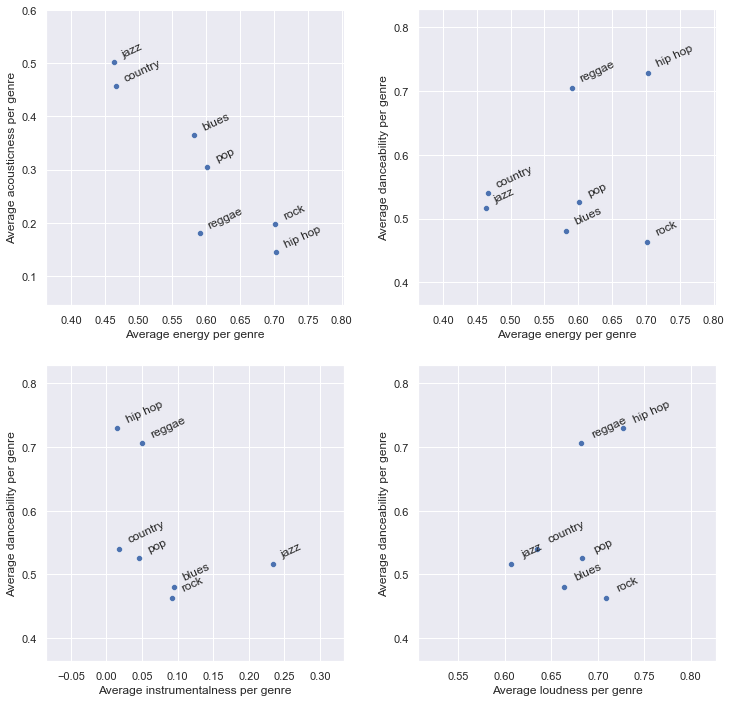

In [24]:
def plot_genres_by_two_measurements(measurement1:str, measurement2:str) -> None:
    """
    Takes the name of two columns and creates a scatterplot. In the plot, each genre is
    included. The point for each genre is set to the average of the columns for all the songs
    in the genre.
    Parmas:
        measurement1: str - string representing the name of the first column used (used as x)
        measurement2: str - string representing the name of the 2nd column used (used as y)
    Return:
        None
    """

    unique_genre = list(df['genre'].unique())

    avg_m1 = np.zeros(len(unique_genre))
    avg_m2 = np.zeros(len(unique_genre))

    for i in unique_genre:
        avg_m1[unique_genre.index(i)] = df[df['genre'] == i][measurement1].mean()
        avg_m2[unique_genre.index(i)] = df[df['genre'] == i][measurement2].mean()

    sns.scatterplot(x = avg_m1, y = avg_m2)

    for i in range(len(unique_genre)):
        plt.text(x = avg_m1[i] + 0.01, y = avg_m2[i] + 0.01, s = unique_genre[i], rotation = 25)


    plt.xlim(min(avg_m1)-0.1,max(avg_m1)+0.1)
    plt.ylim(min(avg_m2)-0.1,max(avg_m2)+0.1)
    xlabel = "Average "+ measurement1 + " per genre"
    plt.xlabel(xlabel)
    ylabel = "Average "+ measurement2 + " per genre"
    plt.ylabel(ylabel)
    
sns.set_theme()
plt.figure(1, figsize=(12, 12))
plt.subplots_adjust(wspace=0.25)

plt.subplot(2,2,1)
plot_genres_by_two_measurements('energy', 'acousticness')
plt.subplot(2,2,2)
plot_genres_by_two_measurements('energy', 'danceability')
plt.subplot(2,2,3)
plot_genres_by_two_measurements('instrumentalness', 'danceability')
plt.subplot(2,2,4)
plot_genres_by_two_measurements('loudness', 'danceability')

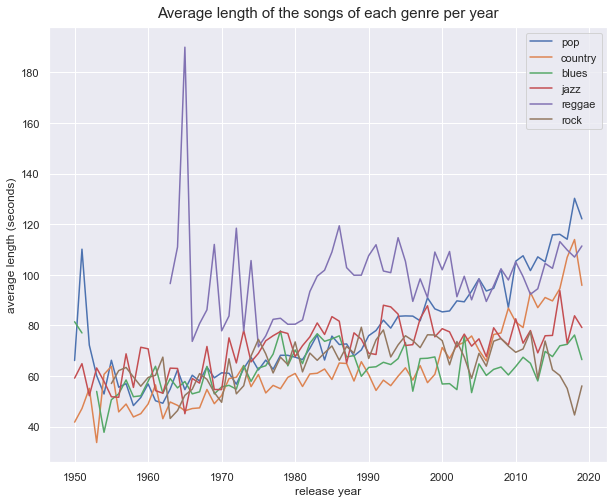

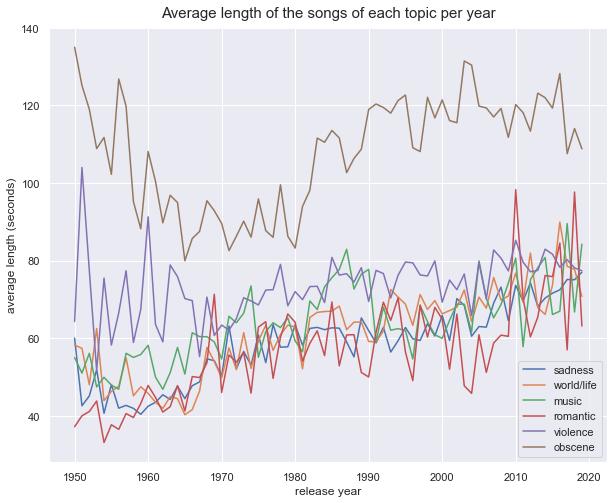

In [25]:
unique_genre = list(df['genre'].unique())
unique_years = list(df['release_date'].unique())
unique_topic = list(df['topic'].unique())

def extract_mean_len_per_genre_per_year():
    """
    Extract an array with the average len for the songs in each genre.
    Params:
        None
    Returns:
        time_series: np.array - an array with the size (no. of genres x
        no. of years) that contains the average len for the songs in each
        genre for each year.
    """
    time_series = np.zeros((len(unique_genre), len(unique_years)))
    i_counter = 0
    for i in unique_genre:
        j_counter = 0
        for j in unique_years:
            copy = df.loc[(df['release_date'] == j) & (df['genre'] == i)]
            time_series[i_counter][j_counter] = copy['len'].mean()
            j_counter += 1
        i_counter += 1
    return time_series

def extract_mean_len_per_topic_per_year():
    """
    Extract an array with the average len for the songs in each topic.
    Params:
        None
    Returns:
        time_series: np.array - an array with the size (no. of topic x
        no. of years) that contains the average len for the songs in each
        topic for each year.
    """
    time_series = np.zeros((len(unique_topic), len(unique_years)))
    i_counter = 0
    for i in unique_topic:
        j_counter = 0
        for j in unique_years:
            copy = df.loc[(df['release_date'] == j) & (df['topic'] == i)]
            time_series[i_counter][j_counter] = copy['len'].mean()
            j_counter += 1
        i_counter += 1
    return time_series

plt.figure(figsize = (10,8))
plt.title("Average length of the songs of each genre per year", size=15, pad=10.0)
plt.xlabel("release year")
plt.ylabel("average length (seconds)")


ts = extract_mean_len_per_genre_per_year()
for i in range(0, 6):
    plt.plot(list(df['release_date'].unique()), ts[i], label = unique_genre[i])

plt.legend()
plt.show()


plt.figure(figsize = (10,8))
plt.title("Average length of the songs of each topic per year", size=15, pad=10.0)
plt.xlabel("release year")
plt.ylabel("average length (seconds)")


ts = extract_mean_len_per_topic_per_year()
for i in range(0, 6):
    plt.plot(list(df['release_date'].unique()), ts[i], label = unique_topic[i])

plt.legend()
plt.show()

In [26]:
"""
Plots the genre distribution for 10y.
If 1950 is selected, the genre distribution will be plotted for the years 1950...1959.
Use the slider to set the year. Default value is 1950.
"""
import datetime
import numpy as np
import pandas as pd

import plotly.graph_objects as go
from ipywidgets import widgets

year_unique = df['release_date'].unique()

# TODO change the name of the function; 3 functions with the same name
def adapt(change):
    """
    A function that updates the data from the chart based on the input of the user.
    Similar to an EventHandler.
    Params:
        change: any 
    Returns:
        None    
    """
    new_df = df.loc[df['lyrics'].str.contains(word.value)]
    
    count_by_year = []
    for i in year_unique:
        count_by_year.append(new_df[new_df['release_date'] == i].shape[0])
    
    g.data[0].y = count_by_year
    return new_df

word = widgets.Text(
    description='Word:   '
)

container = widgets.HBox(children=[word])

initial_df = df.loc[df['lyrics'].str.contains('test')]

count_by_year = []
for i in year_unique:
    count_by_year.append(initial_df[initial_df['release_date'] == i].shape[0])

        
histo = go.Figure(data=[go.Bar(x = year_unique, y = count_by_year)])

g = go.FigureWidget(data=histo)
g.layout.title = 'Number of Unique Songs that Contain a Certain Word by Year'
g.layout.xaxis.title = 'Year'
g.layout.yaxis.title = 'Number of Songs that Contain the Queried Word'
word.observe(adapt, names="value")

widgets.VBox([g, container])

    'data': [{'type': 'bar',
              'uid': '35acc9a7-42d2-404f-91cb-bb082…

In [27]:
"""
Plots the genre distribution for a decade.
If 1950 is selected, the genre distribution will be plotted for the years 1950...1959.
Use the slider to set the year. Default value is 1950s.
"""

genre_list = df['genre'].unique()

# TODO change the name of the function; 3 functions with the same name
def adapt(change):
    """
    A function that updates the data from the chart based on the input of the user.
    Similar to an EventHandler.
    Params:
        change: any 
    Returns:
        None    
    """
    new_df = df[df['release_date'] > year.value]
    new_df = new_df[new_df['release_date'] < year.value + 10]
    genre_unique_new_df = new_df['genre'].unique()
    for genre in genre_list:
        if genre not in genre_unique_new_df:
            new_df = pd.concat([new_df, pd.DataFrame.from_records({'genre': genre}, index = [0])])
    g.data[0].x = new_df['genre']
    return new_df

year = widgets.IntSlider(
    value=1950,
    min=1950,
    max=2010,
    step=10,
    description='Years:',
    continuous_update=False
)

container = widgets.HBox(children=[year])

initial_df = df[df['release_date'] > 1950]
initial_df = initial_df[initial_df['release_date'] < 1950 + 10]

for genre in genre_list:
    if genre not in initial_df['genre'].unique():
        initial_df = pd.concat([initial_df, pd.DataFrame.from_records({'genre': genre}, index = [0])])
        
histo = go.Figure(data=[go.Histogram(x=initial_df['genre'])])

g = go.FigureWidget(data=histo)
g.layout.title = 'Genre Distribution by Decades'
g.layout.xaxis.title = 'Music Genre'
g.layout.yaxis.title = 'Number of Songs Recorded'
year.observe(adapt, names="value")

widgets.VBox([g, container])

    'data': [{'type': 'histogram',
              'uid': '63ce3ce3-5d05-4cc3-a60b…

In [28]:
"""
Plots the number of songs that contain a certain word in their lyrics by genre.
Default value plotted is 'rock'.
"""
import datetime
import numpy as np
import pandas as pd

import plotly.graph_objects as go
from ipywidgets import widgets

genre_unique = df['genre'].unique()

# TODO change the name of the function; 3 functions with the same name
def adapt(change):
    """
    A function that updates the data from the chart based on the input of the user.
    Similar to an EventHandler.
    Params:
        change: any 
    Returns:
        None    
    """
    new_df = df.loc[df['lyrics'].str.contains(word.value)]
    
    count_by_genre = []
    for i in genre_unique:
        count_by_genre.append(new_df[new_df['genre'] == i].shape[0])
    
    g.data[0].y = count_by_genre
    return new_df

word = widgets.Text(
    description='Word:   '
)

container = widgets.HBox(children=[word])

initial_df = df.loc[df['lyrics'].str.contains('rock')]

count_by_genre = []
for i in genre_unique:
    count_by_genre.append(initial_df[initial_df['genre'] == i].shape[0])

        
histo = go.Figure(data=[go.Bar(x = genre_unique, y = count_by_genre)])

g = go.FigureWidget(data=histo)
g.layout.title = 'Number of Unique Songs that Contain a Certain Word'
g.layout.xaxis.title = 'Music Genre'
g.layout.yaxis.title = 'Number of Songs that Contain the Queried Word'
word.observe(adapt, names="value")

widgets.VBox([g, container])

    'data': [{'type': 'bar',
              'uid': 'dcf406fb-ace0-40c4-bb7f-41e88…

In [29]:
label1 = { "pop": 0, "country": 1, "blues": 2, "jazz": 3, "reggae": 4, "rock":  5, "hip hop": 6}

def label_1(row):
    return label1[row['genre']]

df['label1'] = df.apply(lambda row: label_1(row), axis = 1)

# print(df)
# df['label1'] = 0
# for index,row in df.iterrows():
#     df.loc[(df['genre'] == 'pop'), 'label1'] = 0
#     df.loc[(df['genre'] == 'country'), 'label1'] = 1
#     df.loc[(df['genre'] == 'blues'), 'label1'] = 2
#     df.loc[(df['genre'] == 'jazz'), 'label1'] = 3
#     df.loc[(df['genre'] == 'reggae'), 'label1'] = 4
#     df.loc[(df['genre'] == 'rock'), 'label1'] = 5
#     df.loc[(df['genre'] == 'hip hop'), 'label1'] = 6

In [30]:
label2 = { "sadness": 0, "world/life": 1, "music": 2, "romantic": 3, "violence": 4, "obscene":  5, "night/time": 6, "feelings": 7}

def label_2(row):
    return label2[row['topic']]

df['label2'] = df.apply(lambda row: label_2(row), axis = 1)

# df['label2'] = 0
# for index,row in df.iterrows():
#     df.loc[(df['topic'] == 'sadness'), 'label2'] = 0
#     df.loc[(df['topic'] == 'world/life'), 'label2'] = 1
#     df.loc[(df['topic'] == 'music'), 'label2'] = 2
#     df.loc[(df['topic'] == 'romantic'), 'label2'] = 3
#     df.loc[(df['topic'] == 'violence'), 'label2'] = 4
#     df.loc[(df['topic'] == 'obscene'), 'label2'] = 5
#     df.loc[(df['topic'] == 'night/time'), 'label2'] = 6
#     df.loc[(df['topic'] == 'feelings'), 'label2'] = 7

In [31]:
df2 = pd.DataFrame()
df2['lyrics'] = df['lyrics']
df2['label1'] = df['label1']
df2['label2'] = df['label2']

In [32]:
sound_features = []
for index,row in df.iterrows():
    row_features = []
    row_features.append(row['dating'])
    row_features.append(row['violence'])
    row_features.append(row['world/life'])
    row_features.append(row['night/time'])
    row_features.append(row['shake the audience'])
    row_features.append(row['family/gospel'])
    row_features.append(row['romantic'])
    row_features.append(row['communication'])
    row_features.append(row['obscene'])
    row_features.append(row['music'])
    row_features.append(row['movement/places'])
    row_features.append(row['light/visual perceptions'])
    row_features.append(row['family/spiritual'])
    row_features.append(row['like/girls'])
    row_features.append(row['sadness'])
    row_features.append(row['feelings'])
    
#     row_features.append(row['danceability'])
#     row_features.append(row['loudness'])
#     row_features.append(row['acousticness'])
#     row_features.append(row['instrumentalness'])
#     row_features.append(row['valence'])
#     row_features.append(row['energy'])
    
#     row_features.append(row['age'])
    
    sound_features.append(row_features)
df2['features'] = sound_features

In [33]:
#genre by lyrics
gl = []
#genre by characteristics
gc= []
#topic by lyrics
tl = []
#topic by characteristics
tc = []


# Classification by Lyrics

In [34]:
vectorizer = TfidfVectorizer(ngram_range=(1, 3), min_df=10)
data = df['lyrics']
features = vectorizer.fit_transform(data).toarray()
X1 = features
print(X1.shape)

(28372, 23837)


In [35]:
X = df['lyrics']
num_words = X.shape[0]
embed_dim = 32
tokenizer = Tokenizer(num_words=num_words)
tokenizer.fit_on_texts(X)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(X)
length = []
for i in sequences:
    length.append(len(i))
print(np.max(length))

199


In [36]:
X = pad_sequences (sequences, padding = 'post')

## Genre Classification by Lyrics

In [37]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X1, df.label1, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

### Logistic Regression

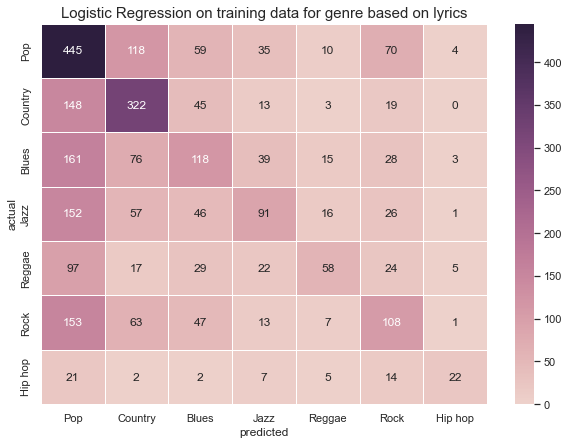

Accuracy: 0.4103


In [38]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
gl.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

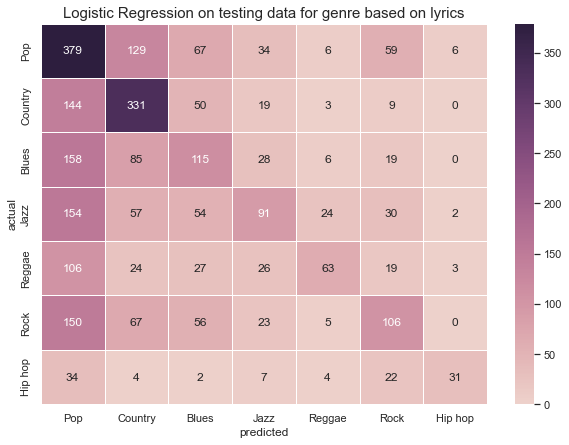

Accuracy: 0.3932


In [39]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
gl.append(score)

cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Bernoulli

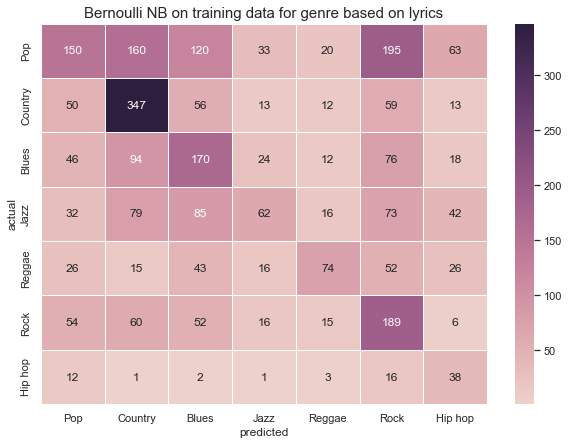

Accuracy: 0.3631


In [40]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
gl.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

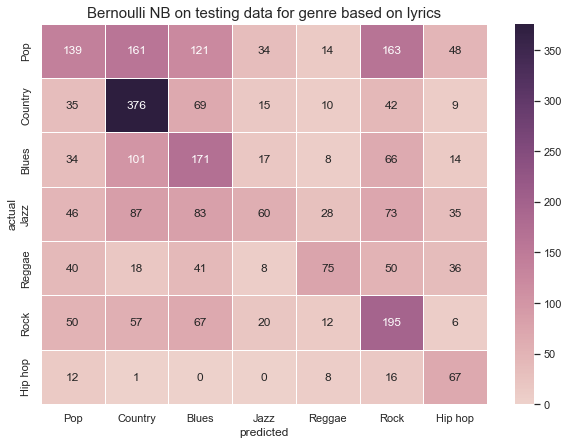

Accuracy: 0.3816


In [41]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

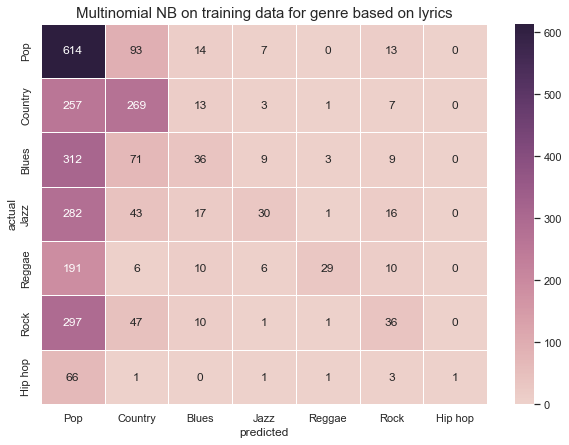

Accuracy: 0.3578


In [42]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])


plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

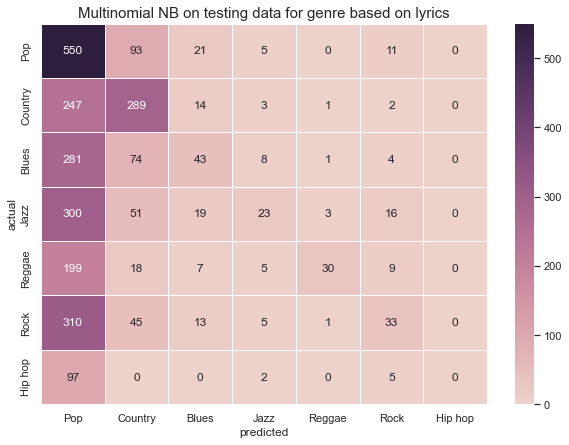

Accuracy: 0.3411


In [43]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

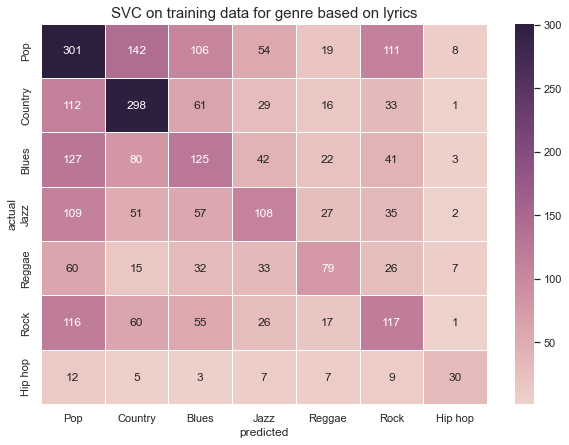

Accuracy: 0.3729


In [44]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

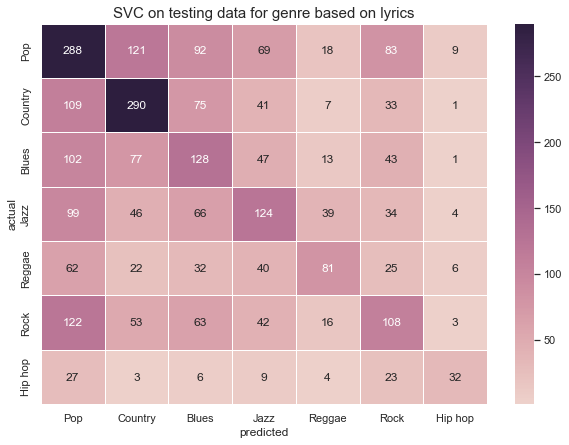

Accuracy: 0.3703


In [45]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### NN

In [46]:
y = df['label1'] 

In [47]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

In [48]:
#model
def build_model(nr_labels, length):
    model = Sequential()
    model.add(Embedding(num_words, embed_dim, input_length = length))
    model.add(LSTM(32, return_sequences=True))
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(nr_labels, activation='sigmoid'))
    return model

def build_compiled_model(length):
    model = build_model(nr_labels=7, length = length)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 199, 32)           907904    
                                                                 
 lstm (LSTM)                 (None, 199, 32)           8320      
                                                                 
 global_max_pooling1d (Globa  (None, 32)               0         
 lMaxPooling1D)                                                  
                                                                 
 dense (Dense)               (None, 64)                2112      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 7)                 455       
                                                        

In [49]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 31s 42ms/step - loss: 1.7687 - accuracy: 0.2632 - val_loss: 1.6800 - val_accuracy: 0.3095
Epoch 2/5
710/710 [==============================] - 32s 45ms/step - loss: 1.5772 - accuracy: 0.3586 - val_loss: 1.6155 - val_accuracy: 0.3542
Epoch 3/5
710/710 [==============================] - 30s 42ms/step - loss: 1.3997 - accuracy: 0.4620 - val_loss: 1.6145 - val_accuracy: 0.3691
Epoch 4/5
710/710 [==============================] - 33s 47ms/step - loss: 1.2170 - accuracy: 0.5531 - val_loss: 1.7105 - val_accuracy: 0.3627
Epoch 5/5
710/710 [==============================] - 32s 45ms/step - loss: 1.0507 - accuracy: 0.6259 - val_loss: 1.8261 - val_accuracy: 0.3662


In [50]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 0.3662


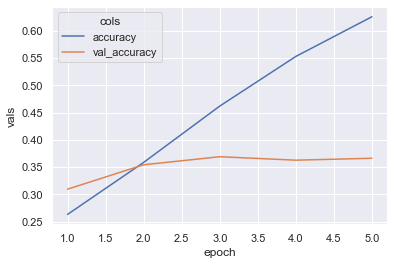

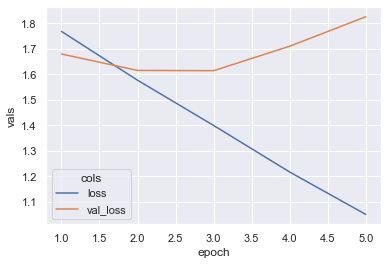

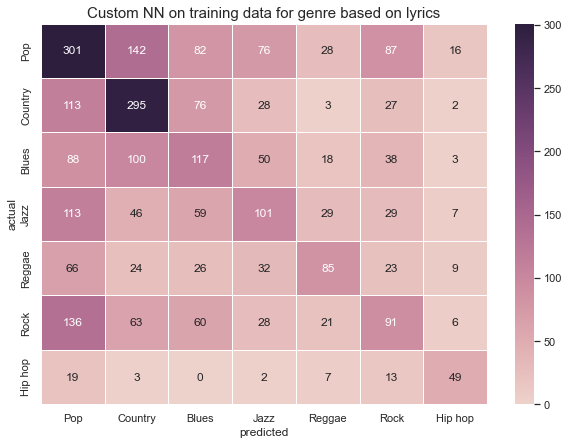

In [51]:
print('On validation data:')
print('Accuracy: %.4f' % accuracy_score(y_val, y_pred))
gl.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [52]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.3721


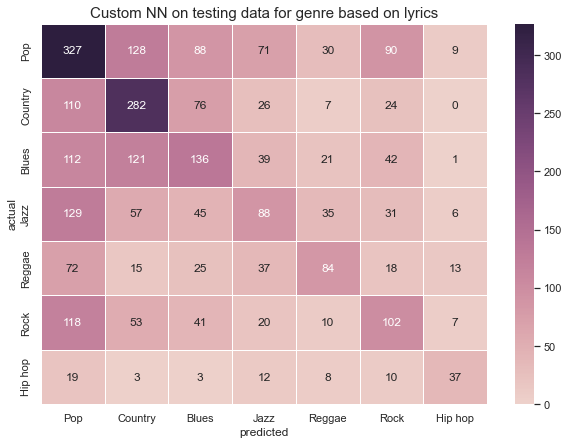

In [53]:
print('On test data:')
print('Accuracy: %.4f' % accuracy_score(y_test, pred))
gl.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

## Topic Classification by Lyrics

In [54]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X1, df.label2, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

### Logistic Regression

2837


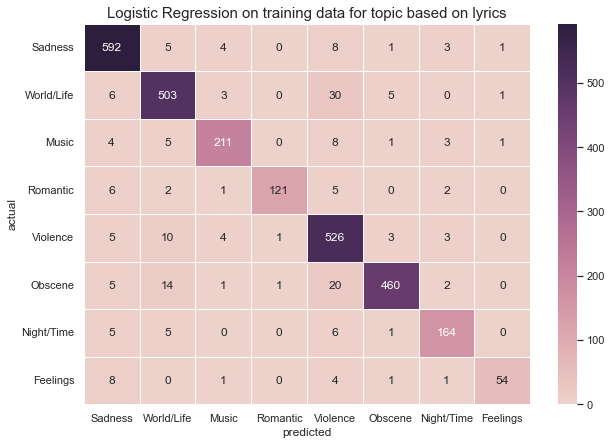

Accuracy: 0.9274


In [55]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
tl.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
print(sum(sum(confusion_matrix(y_val,yv_predicted))))
plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

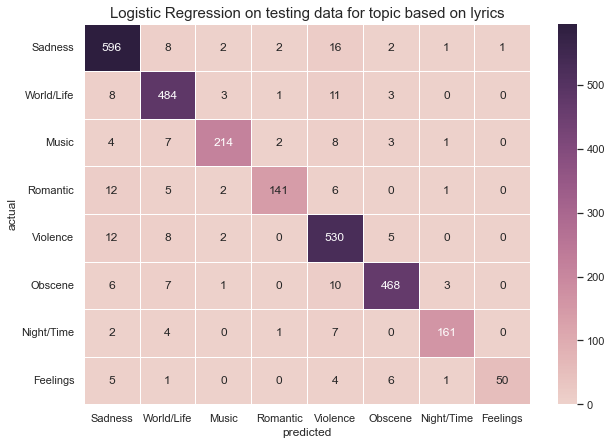

Accuracy: 0.9316


In [56]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
tl.append(score)
cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### Bernoulli

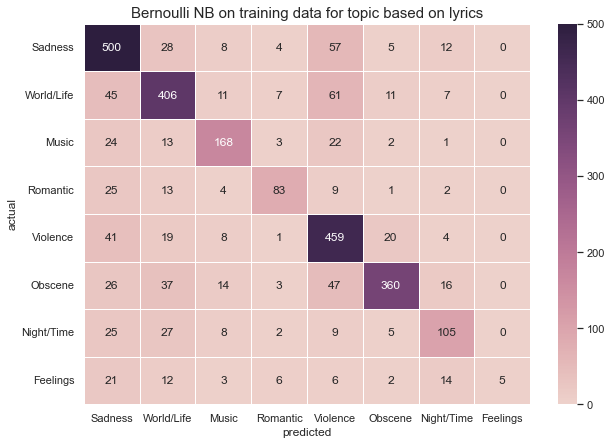

Accuracy: 0.7353


In [57]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted),
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

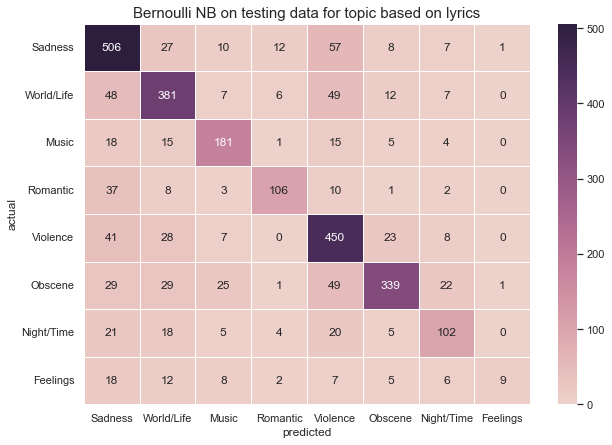

Accuracy: 0.7308


In [58]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted),
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

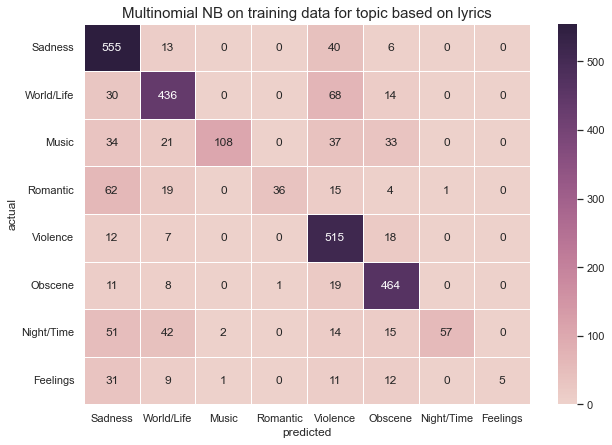

Accuracy: 0.7670


In [59]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted),
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

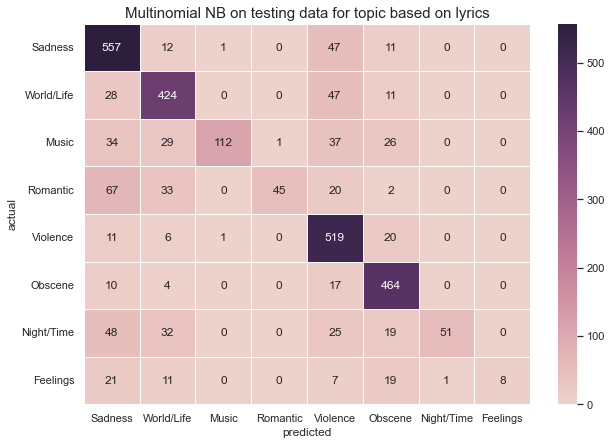

Accuracy: 0.7681


In [60]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

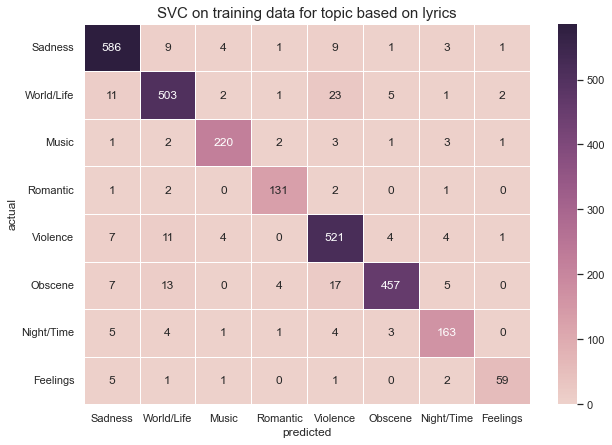

Accuracy: 0.9306


In [61]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

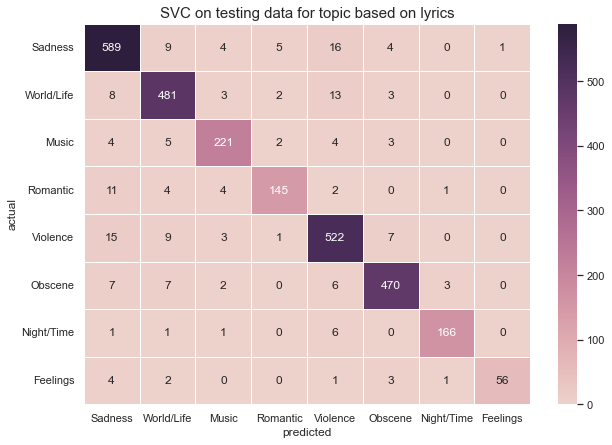

Accuracy: 0.9338


In [62]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### NN

In [63]:
y = df['label2']

In [64]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

In [65]:
#model
def build_model(nr_labels, length):
    model = Sequential()
    model.add(Embedding(num_words, embed_dim, input_length = length))
    model.add(LSTM(32, return_sequences=True))
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(nr_labels, activation='sigmoid'))
    return model

def build_compiled_model(length):
    model = build_model(nr_labels=8, length = length)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 199, 32)           907904    
                                                                 
 lstm_1 (LSTM)               (None, 199, 32)           8320      
                                                                 
 global_max_pooling1d_1 (Glo  (None, 32)               0         
 balMaxPooling1D)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                2112      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 8)                 520       
                                                      

In [66]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 33s 45ms/step - loss: 1.3107 - accuracy: 0.4864 - val_loss: 0.7850 - val_accuracy: 0.7261
Epoch 2/5
710/710 [==============================] - 30s 42ms/step - loss: 0.5634 - accuracy: 0.8094 - val_loss: 0.5702 - val_accuracy: 0.8149
Epoch 3/5
710/710 [==============================] - 29s 41ms/step - loss: 0.3020 - accuracy: 0.9026 - val_loss: 0.4969 - val_accuracy: 0.8569
Epoch 4/5
710/710 [==============================] - 31s 44ms/step - loss: 0.1789 - accuracy: 0.9439 - val_loss: 0.4828 - val_accuracy: 0.8558
Epoch 5/5
710/710 [==============================] - 30s 42ms/step - loss: 0.1183 - accuracy: 0.9623 - val_loss: 0.5269 - val_accuracy: 0.8576


In [67]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 0.86


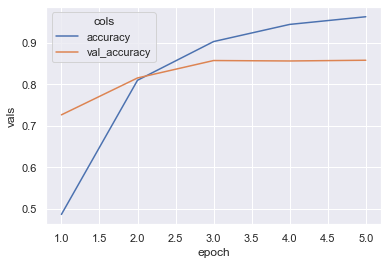

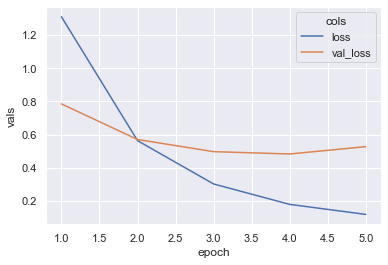

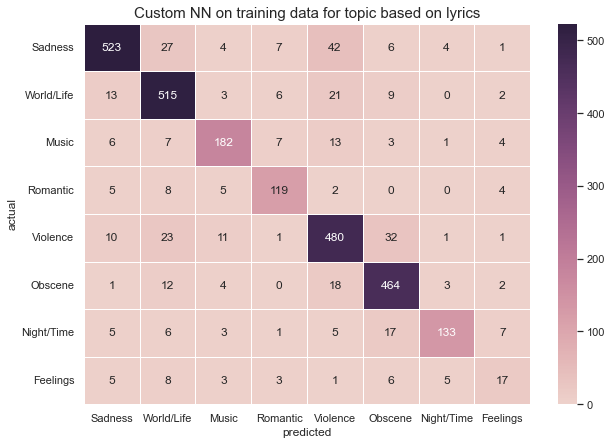

In [68]:
print('On validation data:')
print('Accuracy: %.2f' % accuracy_score(y_val, y_pred))
tl.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [69]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.88


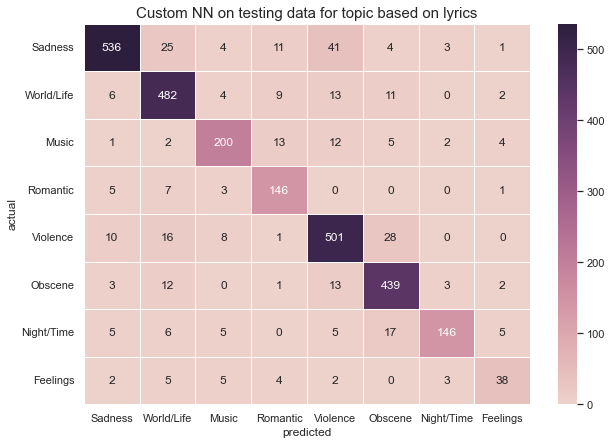

In [70]:
print('On test data:')
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
tl.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

# Classification By Characteristics

In [71]:
X = df2['features']
y = df2['label1']

In [72]:
X = X.tolist()
y = y.tolist()

In [73]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

## Genre Classification by Characteristics

### Logistic Regression

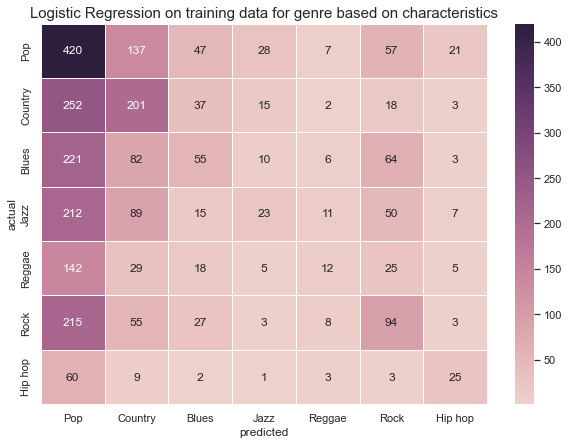

Accuracy: 0.2926


In [74]:
lr = LogisticRegression(solver="sag", penalty='none')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
gc.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
# print(sum(sum(confusion_matrix(y_val,yv_predicted))))
plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

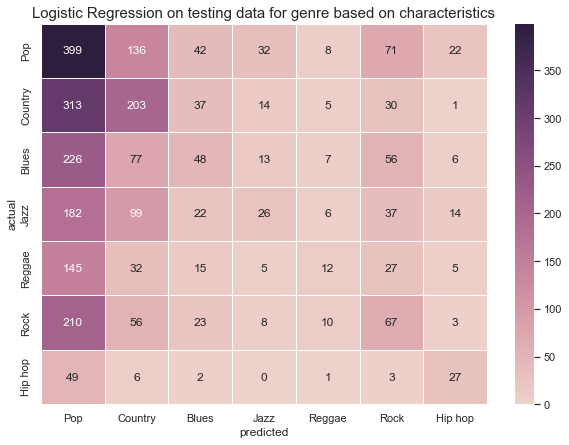

Accuracy: 0.2755


In [75]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
gc.append(score)

cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Bernoulli

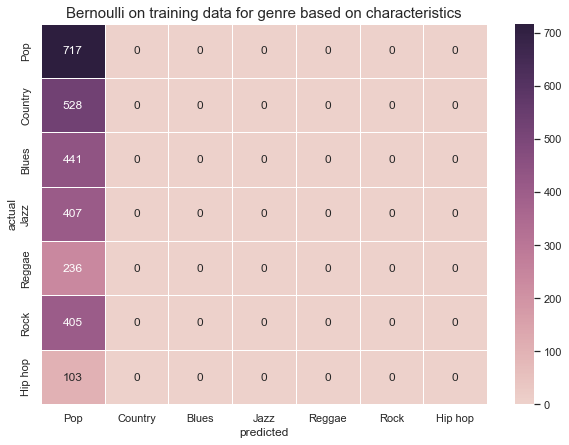

Accuracy: 0.2527


In [76]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

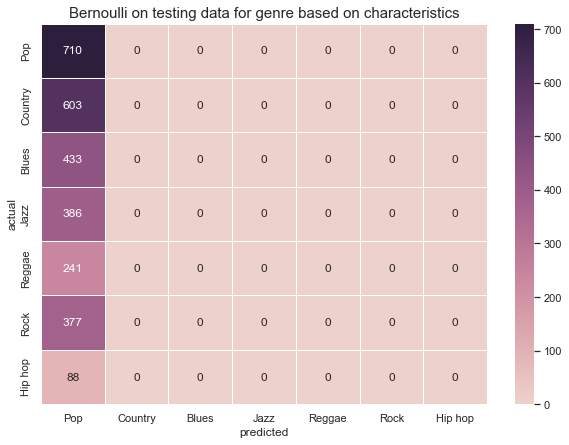

Accuracy: 0.2502


In [77]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

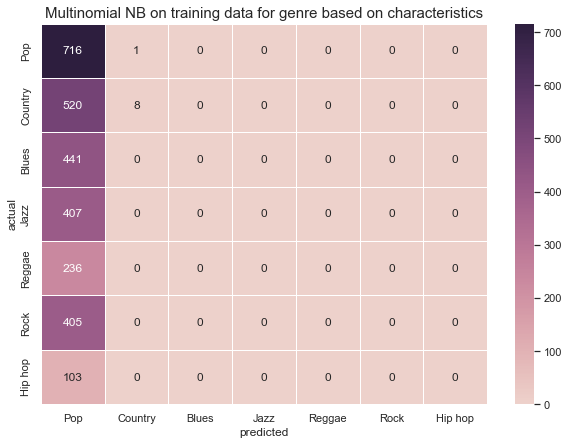

Accuracy: 0.2552


In [78]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

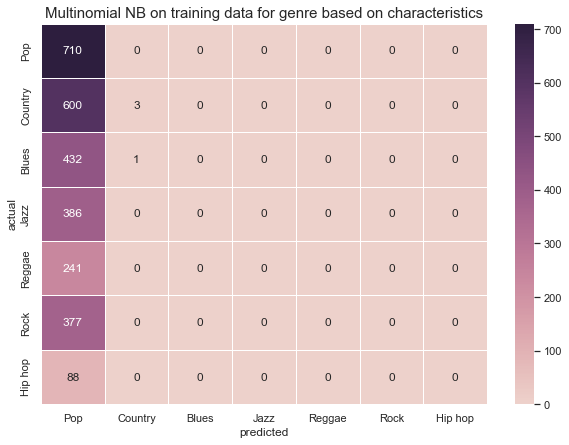

Accuracy: 0.2512


In [79]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

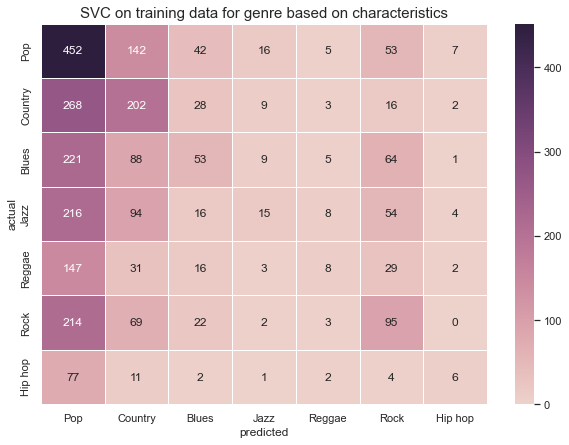

Accuracy: 0.2929


In [80]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

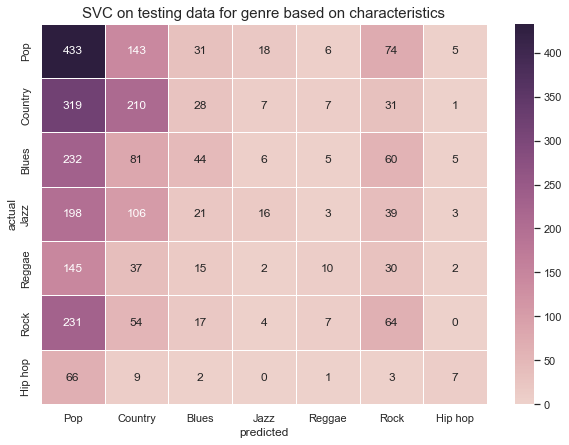

Accuracy: 0.2763


In [81]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### NN

In [82]:
def build_model(nr_labels):
    model = Sequential()
    model.add(Dense(32, activation='relu',input_shape=(16,)))
    model.add(Dense(nr_labels, activation='softmax'))

    return model

def build_compiled_model(length):
    model = build_model(nr_labels=7)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                544       
                                                                 
 dense_5 (Dense)             (None, 7)                 231       
                                                                 
Total params: 775
Trainable params: 775
Non-trainable params: 0
_________________________________________________________________


In [83]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 1s 2ms/step - loss: 1.8077 - accuracy: 0.2495 - val_loss: 1.7511 - val_accuracy: 0.2897
Epoch 2/5
710/710 [==============================] - 1s 1ms/step - loss: 1.7487 - accuracy: 0.2703 - val_loss: 1.7305 - val_accuracy: 0.2961
Epoch 3/5
710/710 [==============================] - 1s 1ms/step - loss: 1.7396 - accuracy: 0.2740 - val_loss: 1.7244 - val_accuracy: 0.2940
Epoch 4/5
710/710 [==============================] - 1s 1ms/step - loss: 1.7357 - accuracy: 0.2770 - val_loss: 1.7199 - val_accuracy: 0.2975
Epoch 5/5
710/710 [==============================] - 1s 1ms/step - loss: 1.7337 - accuracy: 0.2773 - val_loss: 1.7187 - val_accuracy: 0.3021


In [84]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 0.30


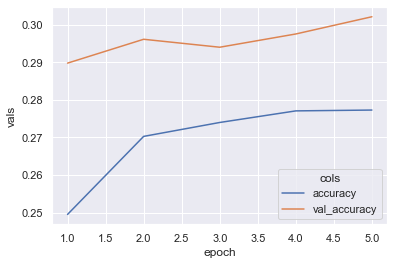

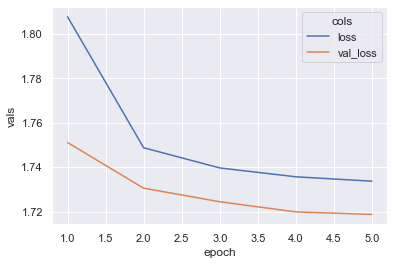

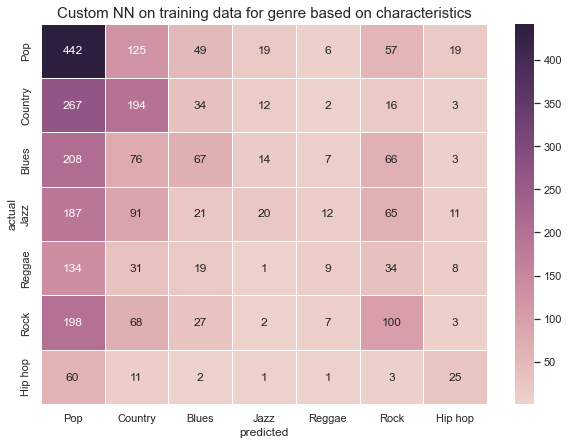

In [85]:
print('On validation data:')
print('Accuracy: %.2f' % accuracy_score(y_val, y_pred))
gc.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [86]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.28


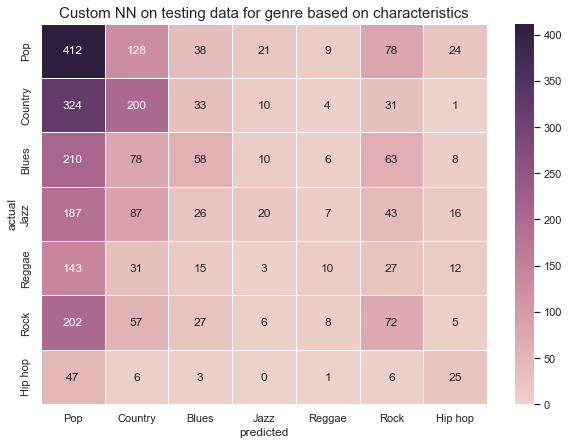

In [87]:
print('On test data:')
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
gc.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()


## Topic Classification by Characteristics

In [88]:
y = df2['label2']
y = y.tolist()
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

### Logistic Regression

E:\Altele2\Anaconda\envs\DataVisualization\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



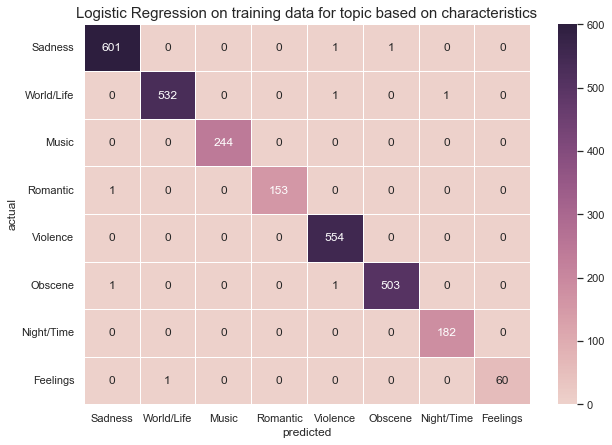

Accuracy: 0.9972


In [89]:
lr = LogisticRegression(solver="sag", penalty='none')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
tc.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

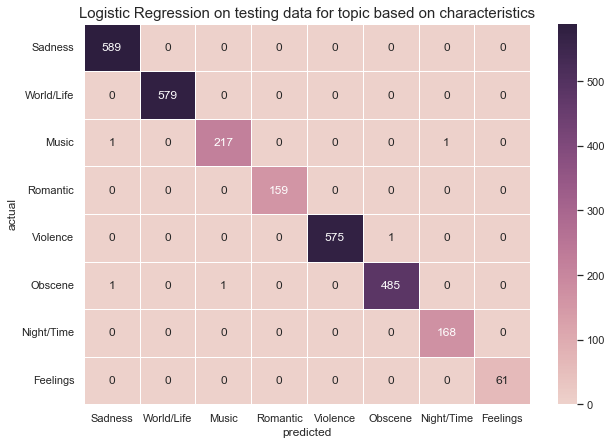

Accuracy: 0.9982


In [90]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
tc.append(score)

cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Bernouli

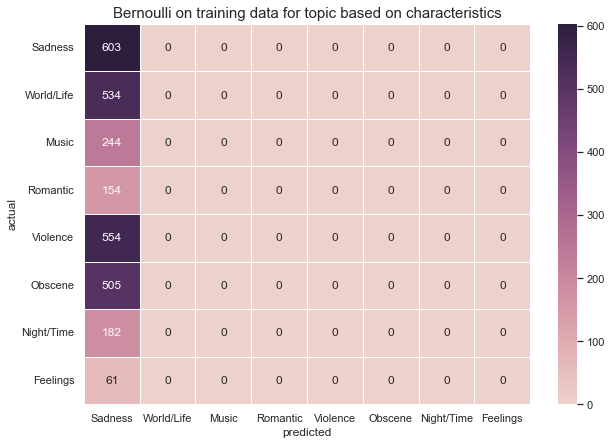

Accuracy: 0.2125


In [91]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
tc.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

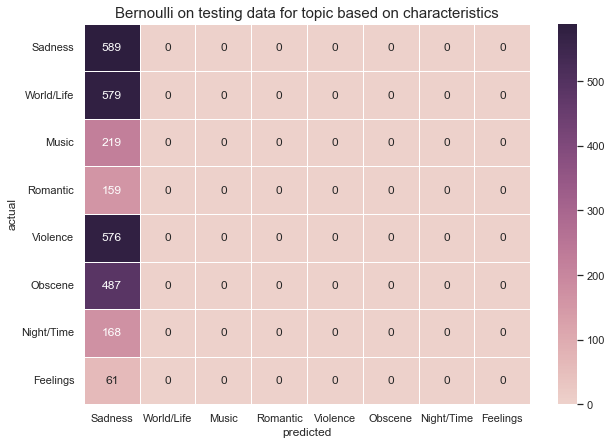

Accuracy: 0.2075


In [92]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
tc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

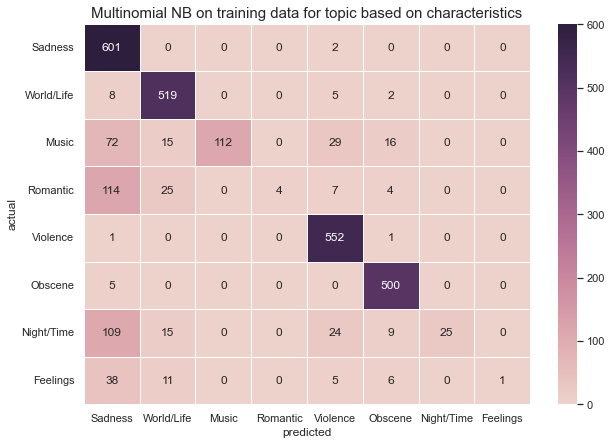

Accuracy: 0.8157


In [93]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tc.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

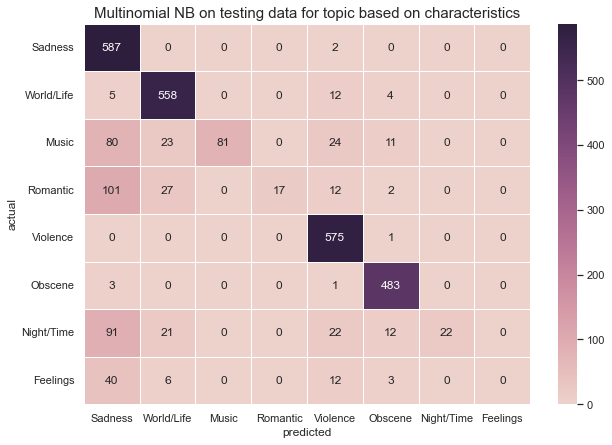

Accuracy: 0.8185


In [94]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

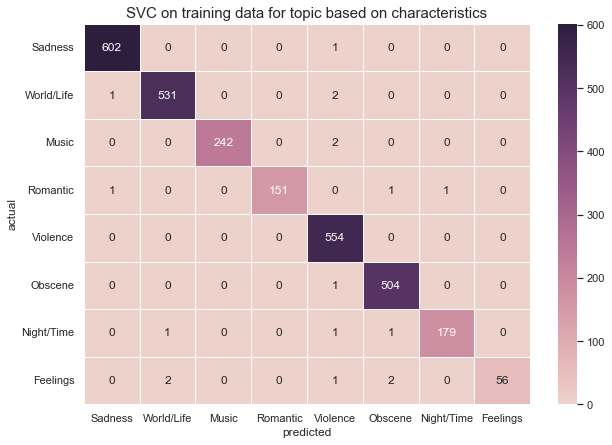

Accuracy: 0.9937


In [95]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tc.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

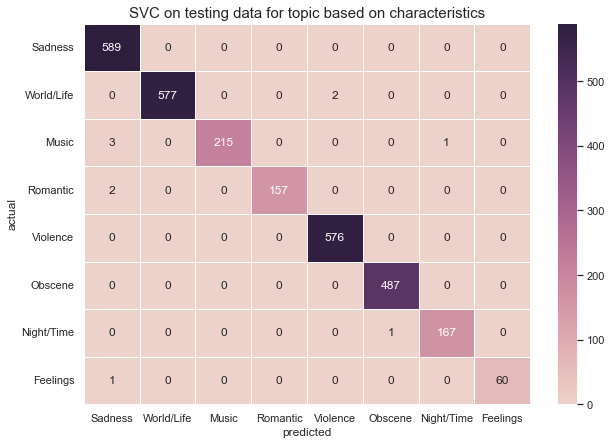

Accuracy: 0.9965


In [96]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### NN

In [97]:
def build_model(nr_labels):
    model = Sequential()
    model.add(Dense(32, activation='relu',input_shape=(16,)))
    model.add(Dense(nr_labels, activation='softmax'))

    return model

def build_compiled_model(length):
    model = build_model(nr_labels=8)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 32)                544       
                                                                 
 dense_7 (Dense)             (None, 8)                 264       
                                                                 
Total params: 808
Trainable params: 808
Non-trainable params: 0
_________________________________________________________________


In [98]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 1s 2ms/step - loss: 0.9399 - accuracy: 0.7675 - val_loss: 0.2596 - val_accuracy: 0.9704
Epoch 2/5
710/710 [==============================] - 1s 1ms/step - loss: 0.1451 - accuracy: 0.9836 - val_loss: 0.0893 - val_accuracy: 0.9901
Epoch 3/5
710/710 [==============================] - 1s 1ms/step - loss: 0.0668 - accuracy: 0.9929 - val_loss: 0.0560 - val_accuracy: 0.9937
Epoch 4/5
710/710 [==============================] - 1s 1ms/step - loss: 0.0456 - accuracy: 0.9951 - val_loss: 0.0427 - val_accuracy: 0.9951
Epoch 5/5
710/710 [==============================] - 1s 1ms/step - loss: 0.0358 - accuracy: 0.9962 - val_loss: 0.0362 - val_accuracy: 0.9954


In [99]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 1.00


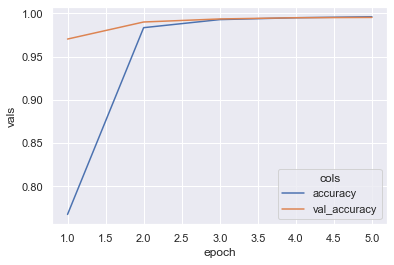

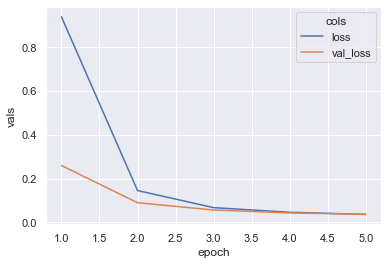

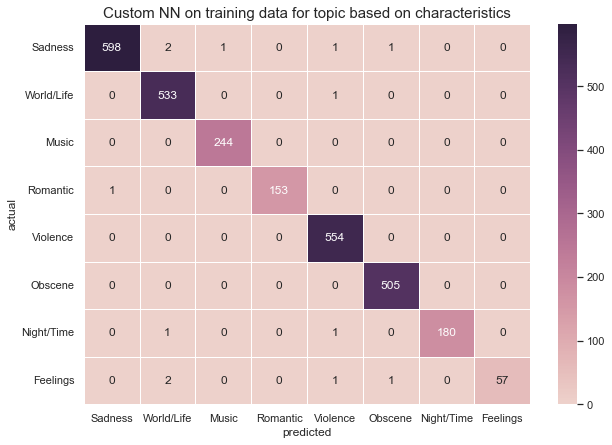

In [100]:
print('On validation data:')
print('Accuracy: %.2f' % accuracy_score(y_val, y_pred))
tc.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [101]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 1.00


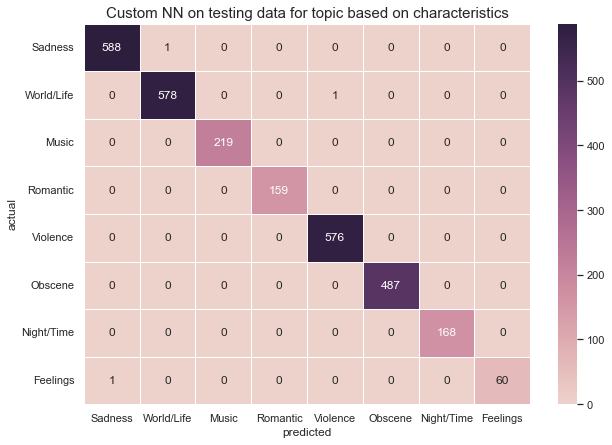

In [102]:
print('On test data:')
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
tc.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [103]:
column_labels=["Genre by Lyrics", "Topic by Lyrics","Genre by Characteritics", "Topic by Characteristics"]
row_labels = ["Logistic Regression Val Acc", "Logistic Regression Test Acc",
              "Bernoulli Val Acc", "Bernoulli Test Acc",
              "MultinomialNB Val Acc", "MultinomialNB Test Acc",
              "LinearSVC Val Acc", "LinearSVC Test Acc",
              "NN Val Acc", "NN Test Acc"]

In [104]:
gl = [round(x,2) for x in gl]
tl = [round(x,2) for x in tl]
gc = [round(x,2) for x in gc]
tc = [round(x,2) for x in tc]

In [105]:
gl = [str(a) for a in gl]
tl = [str(a) for a in tl]
gc = [str(a) for a in gc]
tc = [str(a) for a in tc]

In [106]:
results = pd.DataFrame(index = row_labels, columns = column_labels)
results["Genre by Lyrics"] = gl
results["Topic by Lyrics"] = tl
results["Genre by Characteritics"] = gc
results["Topic by Characteristics"] = tc

In [107]:

results.style.set_properties(**{'text-align': 'center'})

,Genre by Lyrics,Topic by Lyrics,Genre by Characteritics,Topic by Characteristics
Logistic Regression Val Acc,0.41,0.93,0.29,1.0
Logistic Regression Test Acc,0.39,0.93,0.28,1.0
Bernoulli Val Acc,0.36,0.74,0.25,0.21
Bernoulli Test Acc,0.38,0.73,0.25,0.21
MultinomialNB Val Acc,0.36,0.77,0.26,0.82
MultinomialNB Test Acc,0.34,0.77,0.25,0.82
LinearSVC Val Acc,0.37,0.93,0.29,0.99
LinearSVC Test Acc,0.37,0.93,0.28,1.0
NN Val Acc,0.37,0.86,0.3,1.0
NN Test Acc,0.37,0.88,0.28,1.0
